# Bankruptcy data

- 0: not bankrupt
- 1: bankrupt

In [3]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set()

import warnings
warnings.filterwarnings('ignore')



# Evaluation metrics

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import precision_recall_curve
from sklearn.model_selection import cross_val_score


pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 200)

In [4]:
df=pd.read_csv(r"C:\Users\Jeel\Documents\DS-Learnbay-notes\placement-test-march\BANKRUPTCY PREDICTION.csv")

In [3]:
df.head()

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan �,Operating Profit Per Share (Yuan �,Per Share Net profit before tax (Yuan �,Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability,Bankrupt
0,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.256970e-04,0.0,0.458143,0.000725,0.0,0.147950,0.147950,0.147950,0.169141,0.311664,0.017560,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,4.980000e+09,0.000327,0.263100,0.363725,0.002259,0.001208,0.629951,0.021266,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,0.001814,0.003487,1.820930e-04,1.165010e-04,0.032903,0.034164,0.392913,0.037135,0.672775,0.166673,0.190643,0.004094,0.001997,1.473360e-04,0.147308,0.334015,0.276920,0.001036,0.676269,0.721275,0.339077,0.025592,0.903225,0.002022,0.064856,7.010000e+08,6.550000e+09,0.593831,4.580000e+08,0.671568,0.424206,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,0.016469,1
1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,2.897850e-04,0.0,0.461867,0.000647,0.0,0.182251,0.182251,0.182251,0.208944,0.318137,0.021144,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,6.110000e+09,0.000443,0.264516,0.376709,0.006016,0.004039,0.635172,0.012502,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,0.064468,0.001286,0.004917,9.360000e+09,7.190000e+08,0.025484,0.006889,0.391590,0.012335,0.7

In [4]:
df.shape  # Number of Instances: 6819, Number of Attributes: 95

(6819, 95)

In [31]:
df['Bankrupt'].value_counts()/len(df)  # ~ 97/3 distribution of class0/class1

Bankrupt
0    0.967737
1    0.032263
Name: count, dtype: float64

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 95 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 1    ROA(A) before interest and % after tax                   6819 non-null   float64
 2    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 3    Operating Gross Margin                                   6819 non-null   float64
 4    Realized Sales Gross Margin                              6819 non-null   float64
 5    Operating Profit Rate                                    6819 non-null   float64
 6    Pre-tax net Interest Rate                                6819 non-null   float64
 7    After-tax net Interest Rate                              6819 non-null   float64
 8    Non-industry inco

- No Null values

In [6]:
df.duplicated().sum()  # hence no duplicates

0

In [ ]:
# statistical description

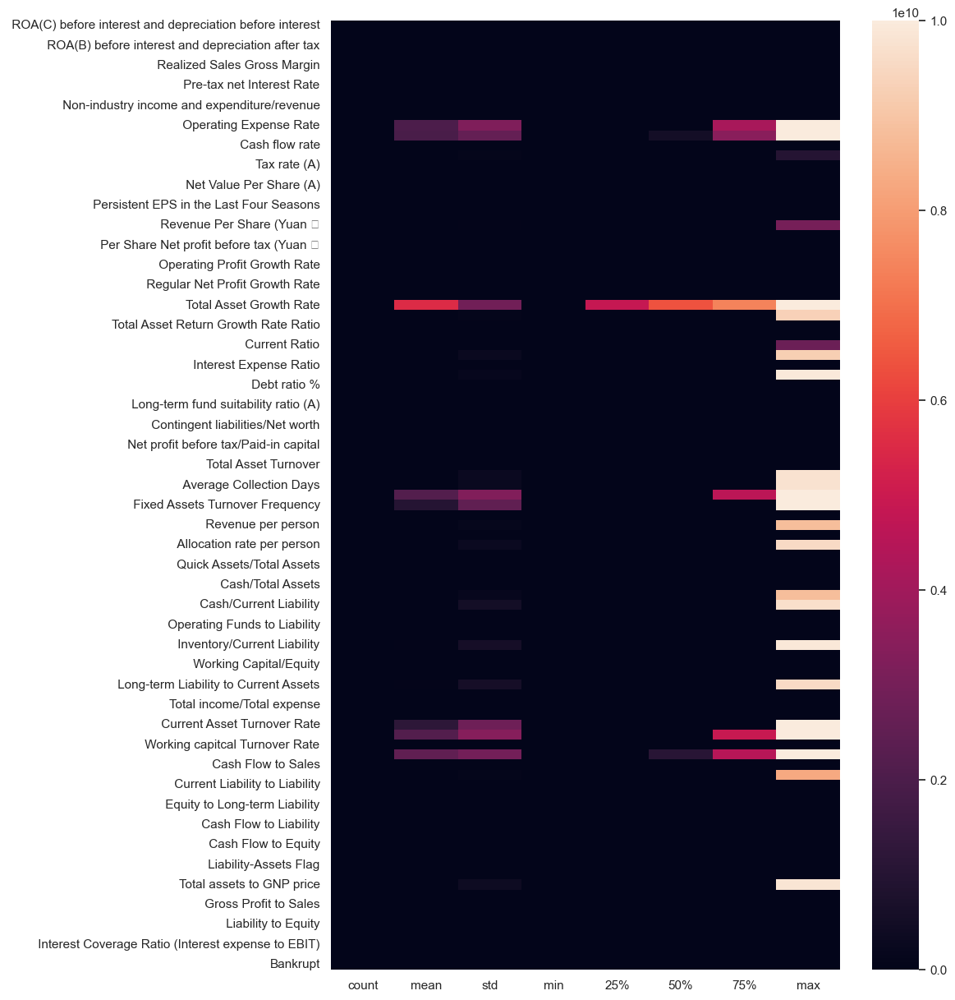

In [7]:
plt.figure(figsize=(10,15))
sns.heatmap(df.describe().T)
plt.show()

# not useful for insight using heatmap as the range is too large

In [8]:
df.describe().T.head(100)

,count,mean,std,min,25%,50%,75%,max
ROA(C) before interest and depreciation before interest,6819.0,5.051796e-01,6.068564e-02,0.0,4.765271e-01,5.027056e-01,5.355628e-01,1.000000e+00
ROA(A) before interest and % after tax,6819.0,5.586249e-01,6.562003e-02,0.0,5.355430e-01,5.598016e-01,5.891572e-01,1.000000e+00
ROA(B) before interest and depreciation after tax,6819.0,5.535887e-01,6.159481e-02,0.0,5.272766e-01,5.522780e-01,5.841051e-01,1.000000e+00
Operating Gross Margin,6819.0,6.079480e-01,1.693381e-02,0.0,6.004447e-01,6.059975e-01,6.139142e-01,1.000000e+00
Realized Sales Gross Margin,6819.0,6.079295e-01,1.691607e-02,0.0,6.004338e-01,6.059759e-01,6.138421e-01,1.000000e+00
Operating Profit Rate,6819.0,9.987551e-01,1.301003e-02,0.0,9.989692e-01,9.990222e-01,9.990945e-01,1.000000e+00
Pre-tax net Interest Rate,6819.0,7.971898e-01,1.286899e-02,0.0,7.973859e-01,7.974636e-01,7.975788e-01,1.000000e+00
After-tax net Interest Rate,6819.0,8.090836e-01,1.360065e-02,0.0,8.093116e-01,8.093752e-01,8.094693e-01,1.000000e+00
Non-industry income and expenditure/revenue,6819.0,3.036229e-01,1.116344e-02,0.0,3.034663e-01,3.035255e-01,3.035852e-01,1.000000e+00
Continuous interest rate (after tax),6819.0,7.813814e-01,1.267900e-02,0.0,7.815668e-01,7.816350e-01,7.817354e-01,1.000000e+00


# EDA

## Distributions of variables wrt target 0 or 1:

- will tell me what is the range of features when target is 0 and what is the range of features when target is 1.

- so whcih features are most reflective of the separation between classes and what are the range values of the features which lead to class 1 (failure)


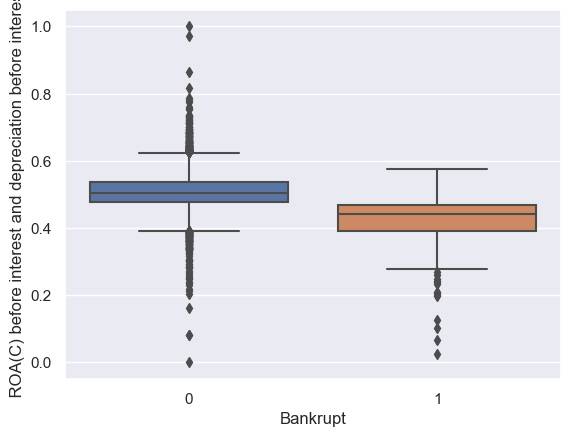

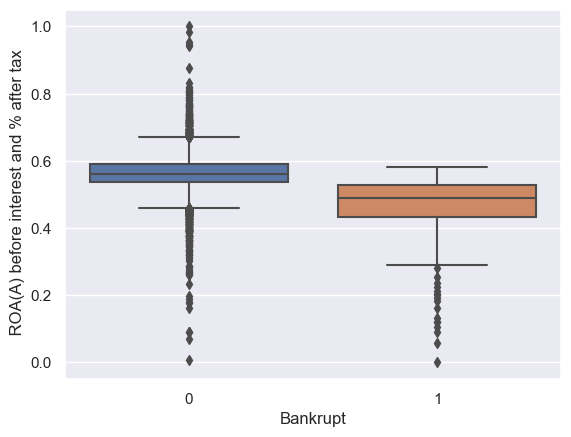

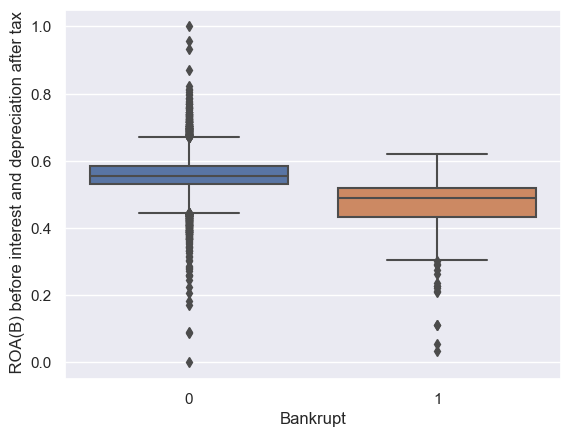

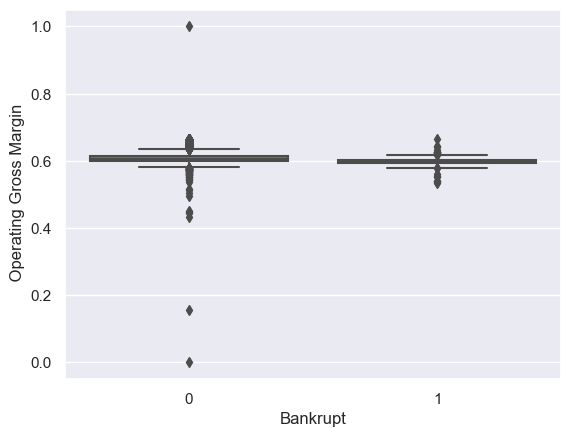

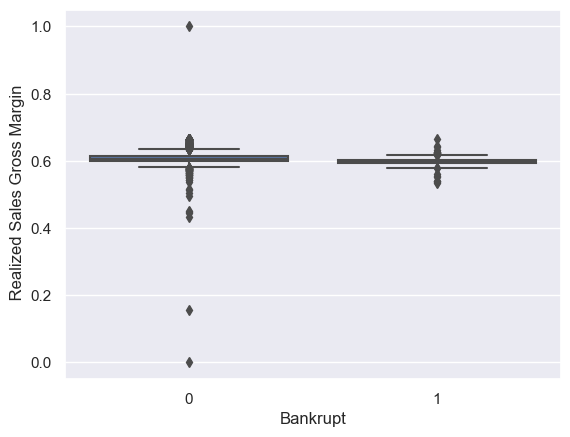

...

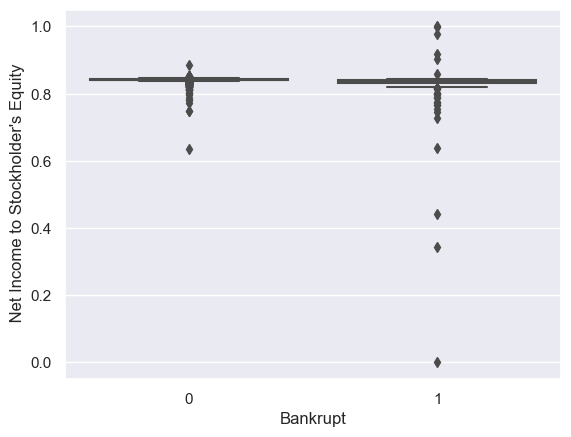

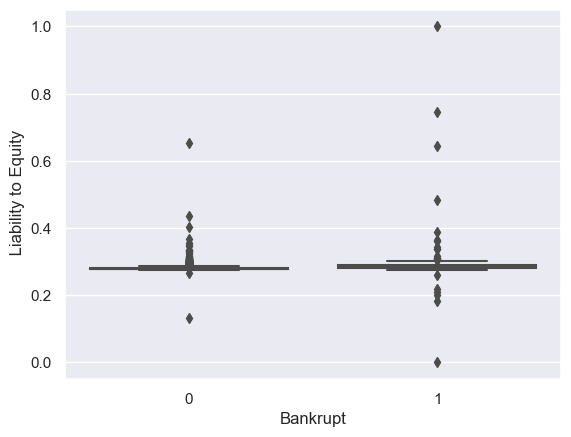

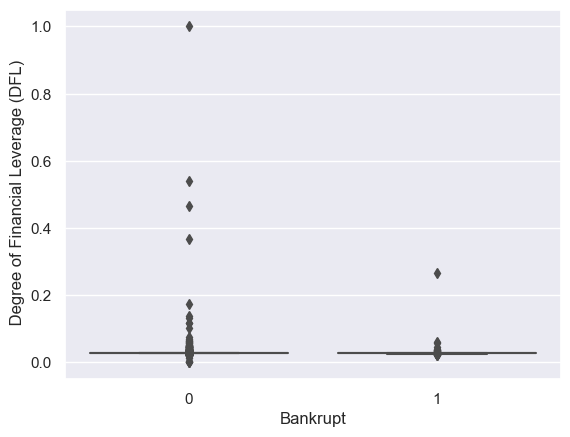

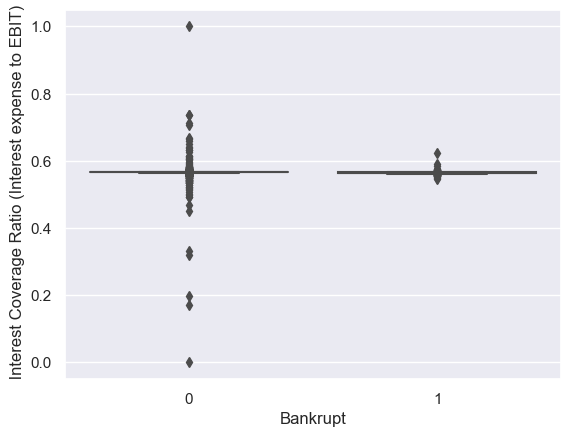

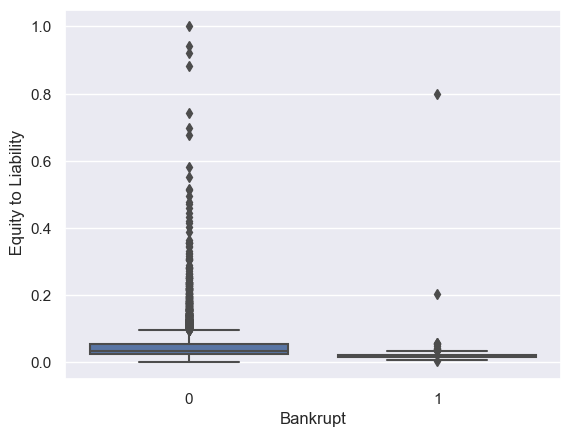

In [9]:
for i in df.columns[:-1]:
    sns.boxplot(data= df, y=i, x='Bankrupt')
    plt.show()

In [ ]:
# insights:

# roa(c), roa(b), operating gross margin have lower median values for class 1
# Interestingly, total_debt/total_net_worth (total liability/total equity) can be extremely large for companies that have not gone bankrupt, it suggests other serious factors affect the bankruptcy. Bankrupt companies have a smaller total_debt/total_net_worth ratio value. 
# operating gross margin shows similar median values in both the classes (non-differentiator) 
# Tax rate(A) feature shows a significant difference between the classes, a smaller rate could encourage bankruptcy.
# Total assets growth rate median is smaller for class 1.
# As expected, the median debt ratio(%) is larger for bankrupt companies.
# In general, the range of the feature values for class 1 is smaller compared to the range of class 0
# Also, the feature values significantly overlap between classes 0 and 1. There is a huge overlap in the distribution of the two classes for almost all features. This means that if we try to find the outliers from the data distribution of each column, the outlier values will not belong to class 1 necessarily since the range of class 1 is much smaller than the range of class 0. Hence didn’t do any outlier treatment here.
# Importantly, the boxplot shows an extremely large number of outliers for class 0, so the IQR method with 1.5 multiplier is not the ideal outlier detection method for this data. Domain knowledge is required to deal with outliers here. ( for e.g., feature Interest-bearing debt interest rate)



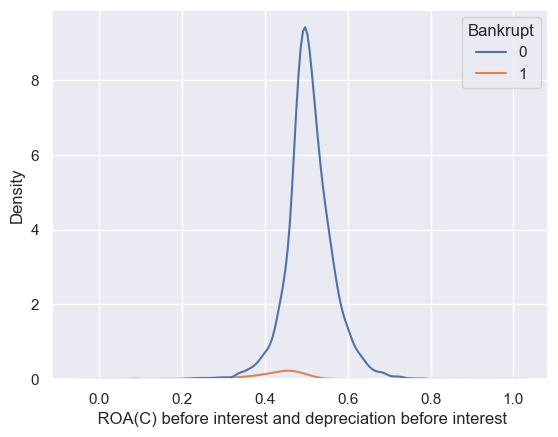

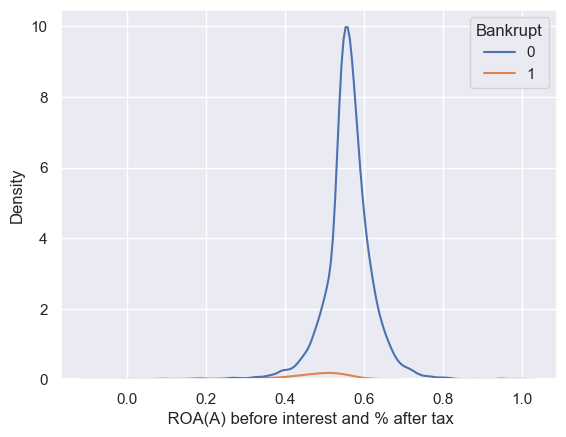

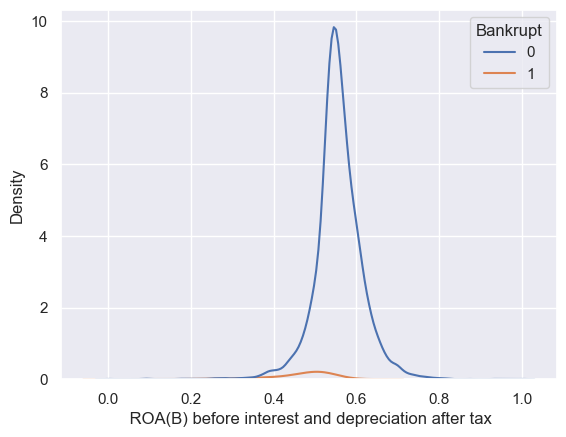

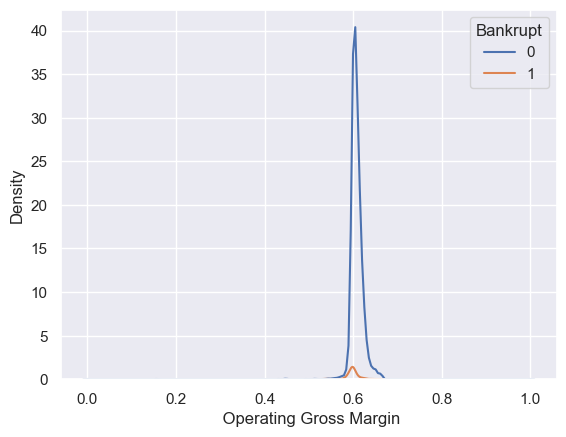

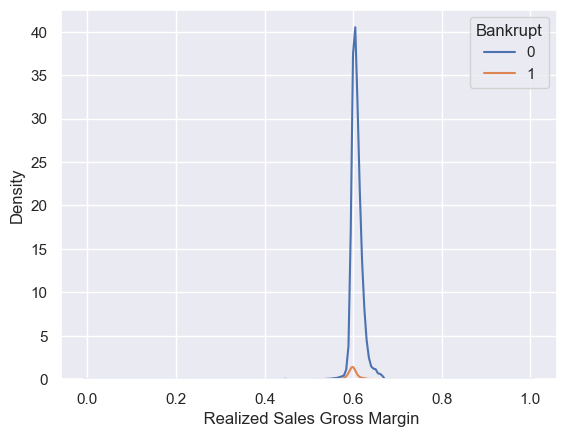

...

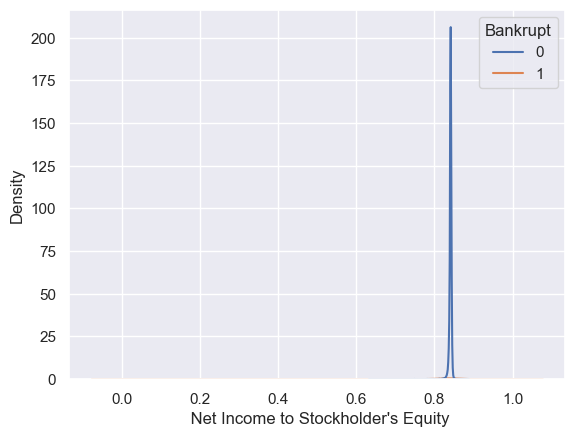

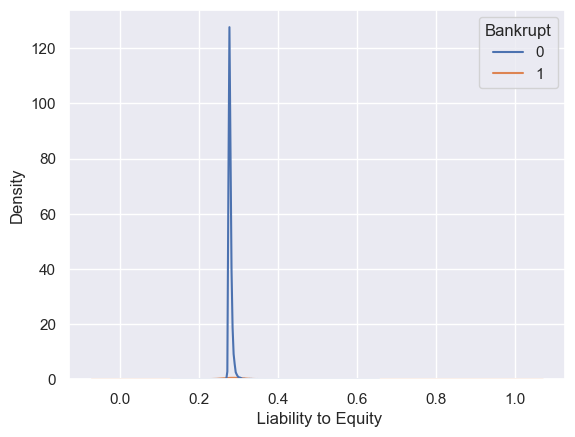

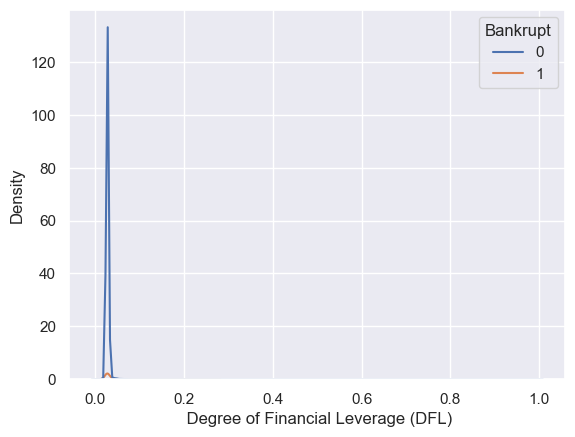

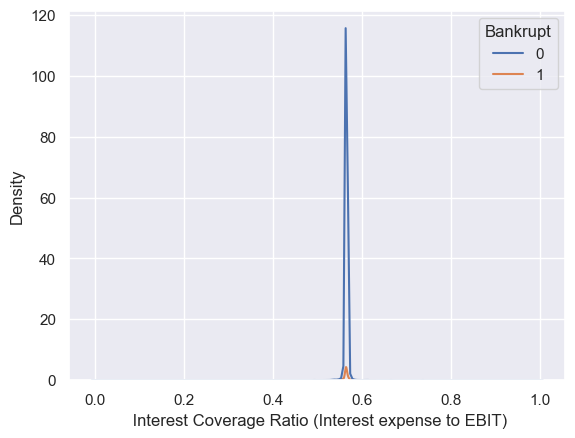

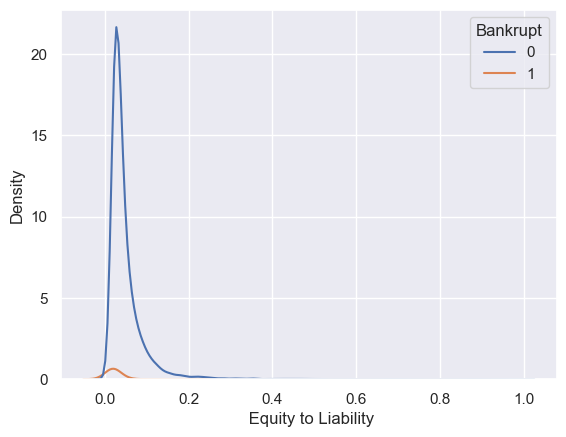

In [7]:
for i in df.columns[:-1]:
    sns.kdeplot(data= df, hue=df['Bankrupt'], x=df[i])
    plt.show()

In [ ]:
# outlier presence in both the groups

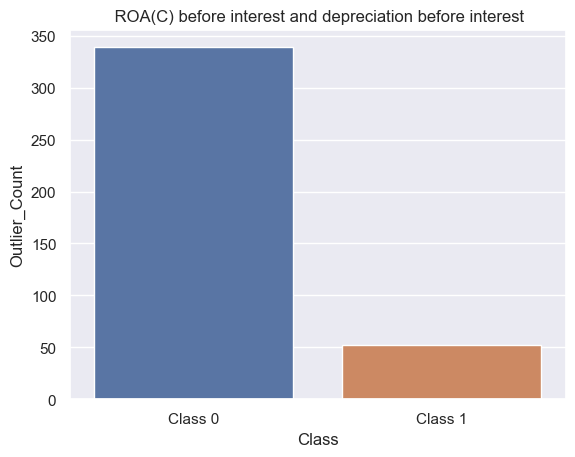

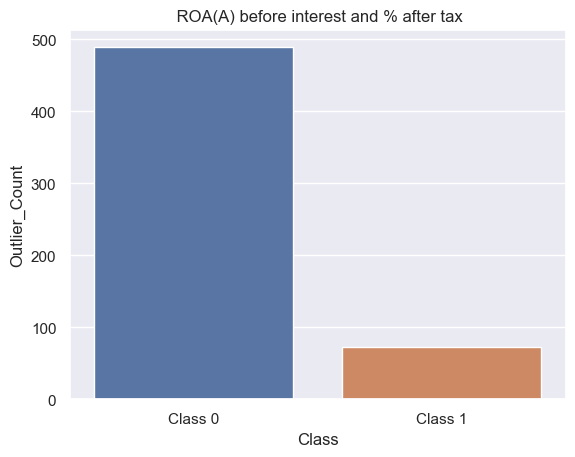

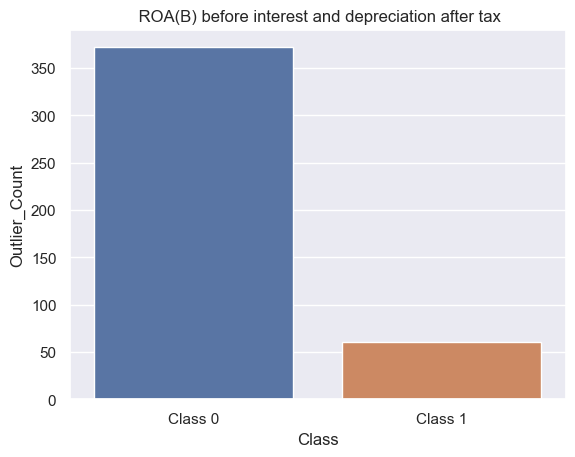

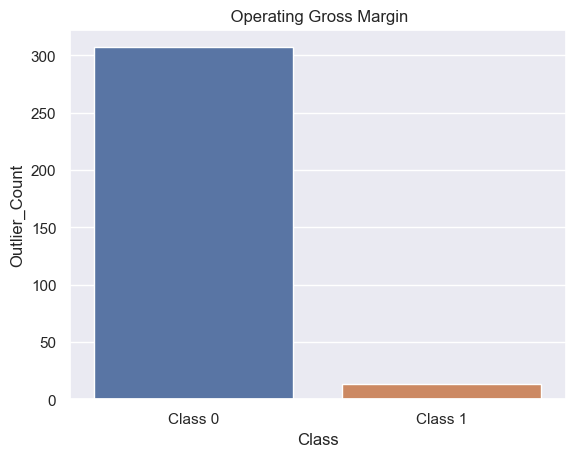

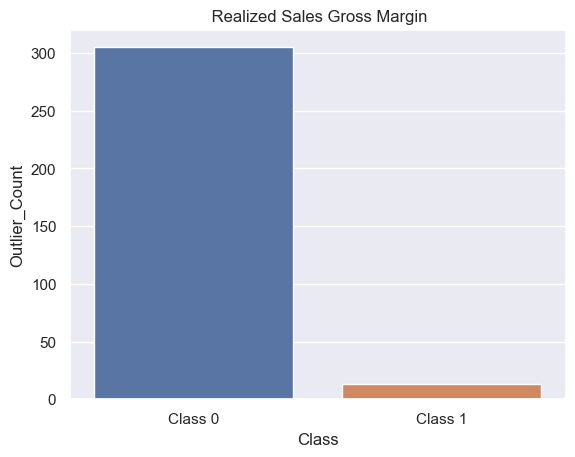

...

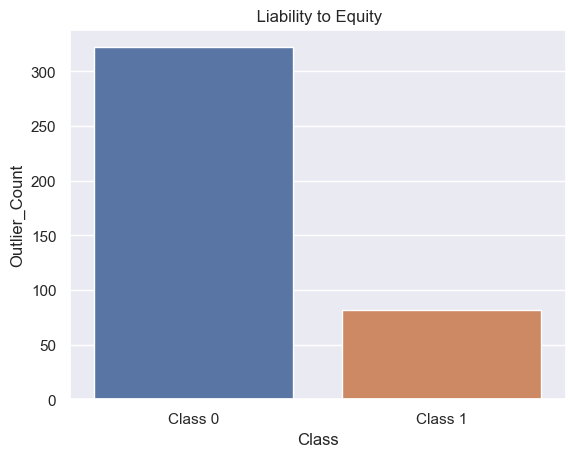

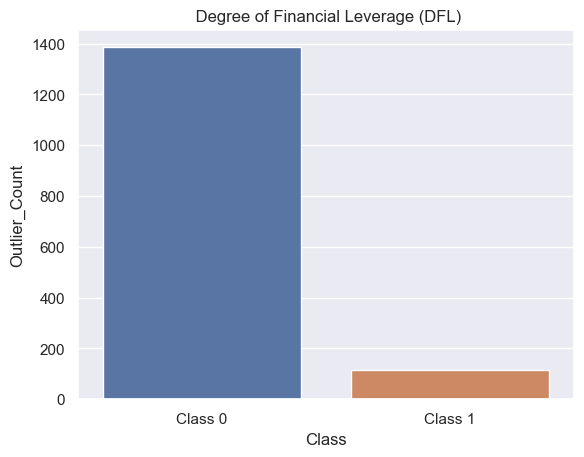

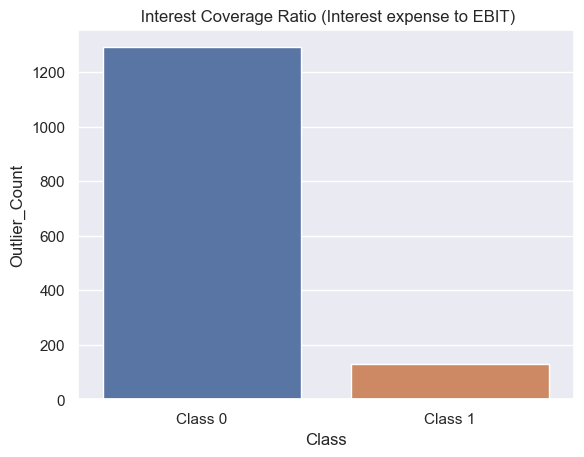

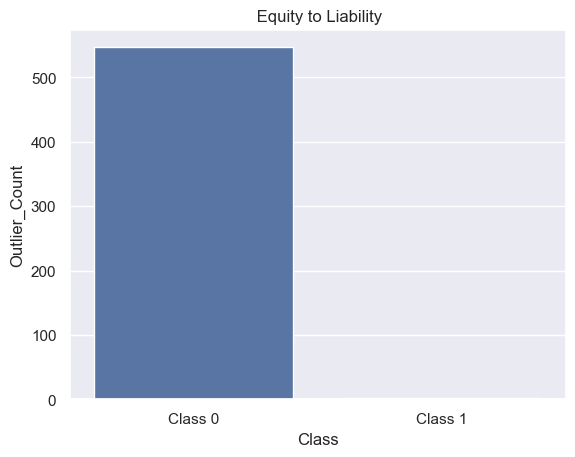

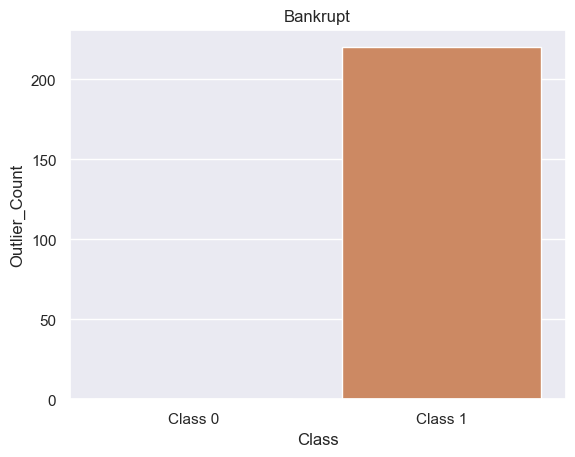

In [19]:
for i in df.columns:
    s=df[i]
    q1=df[i].quantile(0.25)
    q3=df[i].quantile(0.75)
    iqr=q3-q1
    up_limit=q3 + 1.5*iqr
    low_limit=q1 - 1.5*iqr
    
    s_outlier=s[(s>up_limit) | (s<low_limit)]
    
    
    class_1=len(s_outlier[df['Bankrupt']==1])
    class_0=len(s_outlier[df['Bankrupt']==0])
    
#     print(i)
#     print("**************"*3)
#     print('counts of outliers in class 0:', class_0)
#     print('counts of outliers in class 1:', class_1)
#     print("**************"*3)
    
    outlier_counts = pd.DataFrame({'Class': ['Class 0', 'Class 1'],
                               'Outlier_Count': [class_0, class_1]})

    sns.barplot(x='Class', y='Outlier_Count', data=outlier_counts)
    plt.title(i)
    plt.show()
    


# outliers

In [ ]:
# no point in removing outliers since the data values overlap in both class 0 and 1.
# and as seen from above, outlier values mostly belong to class 0 except for features Debt Ratio %, Net worth/Assets, Liability-Assets Flag where they mostly belon to class 1 highlighting their possible role in predicting bankruptcy. 

# splitting into x and y variables

In [10]:
x=df.iloc[:,:-1]
y=df['Bankrupt']

In [11]:
x.head()

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan �,Operating Profit Per Share (Yuan �,Per Share Net profit before tax (Yuan �,Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
0,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.256970e-04,0.0,0.458143,0.000725,0.0,0.147950,0.147950,0.147950,0.169141,0.311664,0.017560,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,4.980000e+09,0.000327,0.263100,0.363725,0.002259,0.001208,0.629951,0.021266,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,0.001814,0.003487,1.820930e-04,1.165010e-04,0.032903,0.034164,0.392913,0.037135,0.672775,0.166673,0.190643,0.004094,0.001997,1.473360e-04,0.147308,0.334015,0.276920,0.001036,0.676269,0.721275,0.339077,0.025592,0.903225,0.002022,0.064856,7.010000e+08,6.550000e+09,0.593831,4.580000e+08,0.671568,0.424206,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,0.016469
1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,2.897850e-04,0.0,0.461867,0.000647,0.0,0.182251,0.182251,0.182251,0.208944,0.318137,0.021144,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,6.110000e+09,0.000443,0.264516,0.376709,0.006016,0.004039,0.635172,0.012502,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,0.064468,0.001286,0.004917,9.360000e+09,7.190000e+08,0.025484,0.006889,0.391590,0.012335,0.751111,0.127

## multicollinearity and collinearity

In [ ]:
# to check multicollinearity

In [12]:
corr=x.corr(method='spearman')
corr

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan �,Operating Profit Per Share (Yuan �,Per Share Net profit before tax (Yuan �,Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
ROA(C) before interest and depreciation before interest,1.000000,0.931685,0.989081,0.506232,0.504194,0.806463,0.842781,0.829903,0.386448,0.858867,-0.041300,0.147770,0.473233,-0.118354,0.458064,0.595933,0.595815,0.595247,0.907933,0.520784,0.362882,0.837577,0.894697,0.411926,0.425922,0.471091,0.469238,0.478016,0.207427,0.647279,0.498022,0.363169,0.266577,0.326836,0.174551,-0.252403,-0.247509,0.247509,0.091547,-0.314196,-0.112523,0.837561,0.893486,-0.084846,0.314388,0.087556,-0.095258,-0.100245,-0.019746,0.187960,0.046835,0.710849,-0.125540,0.264368,0.223218,0.114448,0.284832,0.307599,0.279015,-0.173888,0.487171,-0.088502,-0.029022,0.059588,0.198491,-0.201996,-0.084739,0.808604,0.817938,-0.120201,-0.118067,-0.071605,0.137056,-0.085563,0.222884,-0.022180,0.059588,-0.201996,-0.105767,0.237686,0.233247,0.491062,0.232641,-0.265883,-0.055489,0.924448,-0.006847,0.189254,0.506225,0.898858,-0.240925,0.219844,0.183601,0.247505
ROA(A) before interest and % after tax,0.931685,1.000000,0.941016,0.496501,0.494273,0.800226,0.898640,0.899165,0.488196,0.888005,-0.026662,0.117831,0.399679,-0.102959,0.434234,0.648507,0.648368,0.648187,0.947539,0.458678,0.407187,0.851815,0.955232,0.414649,0.428381,0.521446,0.520306,0.492031,0.217052,0.700586,0.533710,0.298908,0.296655,0.334208,0.188814,-0.246323,-0.242536,0.242536,0.228782,-0.339681,-0.068641,0.851663,0.954253,-

In [13]:
corr.shape

(94, 94)

In [14]:
high_corr=[]
list_index=[]
list_col=[]
for i in range(len(corr)):
    for j in range(0,i):
#        print(corr.loc[i,j])
        if (corr.iloc[i,j]>0.75 and corr.iloc[i,j]<1) or (corr.iloc[i,j]<-0.75 and corr.iloc[i,j]>-1):
            high_corr.append(corr.iloc[i,j])
            list_index.append(corr.columns[i])
            list_col.append(corr.columns[j])
        
        
high_corr_df=pd.DataFrame({'var1': list_index, 'var2':list_col, 'corr': high_corr})
high_corr_df
        

,var1,var2,corr
0,ROA(A) before interest and % after tax,ROA(C) before interest and depreciation befor...,0.931685
1,ROA(B) before interest and depreciation after...,ROA(C) before interest and depreciation befor...,0.989081
2,ROA(B) before interest and depreciation after...,ROA(A) before interest and % after tax,0.941016
3,Realized Sales Gross Margin,Operating Gross Margin,0.999055
4,Operating Profit Rate,ROA(C) before interest and depreciation befor...,0.806463
...,...,...,...
206,Equity to Liability,Borrowing dependency,-0.819116
207,Equity to Liability,Current Liability to Assets,-0.825712
208,Equity to Liability,Current Liabilities/Equity,-0.911296
209,Equity to Liability,Current Liability to Equity,-0.911296


In [ ]:
# insight: highly multicollinear dataset, so not gonna go ahead with Logistic regression

In [ ]:
# to check collinearity of variables wrt target

In [15]:
corr1=df.corr(method='spearman')
corr1

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan �,Operating Profit Per Share (Yuan �,Per Share Net profit before tax (Yuan �,Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability,Bankrupt
ROA(C) before interest and depreciation before interest,1.000000,0.931685,0.989081,0.506232,0.504194,0.806463,0.842781,0.829903,0.386448,0.858867,-0.041300,0.147770,0.473233,-0.118354,0.458064,0.595933,0.595815,0.595247,0.907933,0.520784,0.362882,0.837577,0.894697,0.411926,0.425922,0.471091,0.469238,0.478016,0.207427,0.647279,0.498022,0.363169,0.266577,0.326836,0.174551,-0.252403,-0.247509,0.247509,0.091547,-0.314196,-0.112523,0.837561,0.893486,-0.084846,0.314388,0.087556,-0.095258,-0.100245,-0.019746,0.187960,0.046835,0.710849,-0.125540,0.264368,0.223218,0.114448,0.284832,0.307599,0.279015,-0.173888,0.487171,-0.088502,-0.029022,0.059588,0.198491,-0.201996,-0.084739,0.808604,0.817938,-0.120201,-0.118067,-0.071605,0.137056,-0.085563,0.222884,-0.022180,0.059588,-0.201996,-0.105767,0.237686,0.233247,0.491062,0.232641,-0.265883,-0.055489,0.924448,-0.006847,0.189254,0.506225,0.898858,-0.240925,0.219844,0.183601,0.247505,-0.223589
ROA(A) before interest and % after tax,0.931685,1.000000,0.941016,0.496501,0.494273,0.800226,0.898640,0.899165,0.488196,0.888005,-0.026662,0.117831,0.399679,-0.102959,0.434234,0.648507,0.648368,0.648187,0.947539,0.458678,0.407187,0.851815,0.955232,0.414649,0.428381,0.521446,0.520306,0.492031,0.217052,0.700586,0.533710,0.298908,0.296655,0.334208,0.188814,-0.246323,-0.242536,0.242536,0.228782,-0.339681,-0.068641,

In [16]:
high_corr1=[]
for i in df.columns:
    high_corr1.append(corr1.loc[i,'Bankrupt'])

In [117]:
# high_corr1_=high_corr1.copy()
# high_corr1_.sort(reverse=True)
# high_corr1_

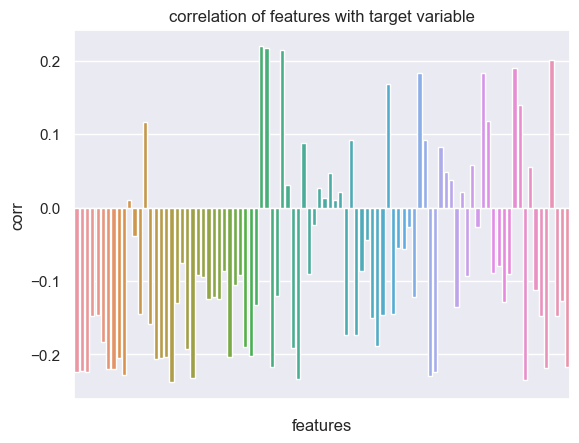

In [17]:
b1=sns.barplot(x=df.columns[:-1], y=high_corr1[:-1])
b1.set(xticklabels=[])
b1.set(xlabel='features')
b1.set(ylabel='corr')
b1.set(title='correlation of features with target variable')
plt.show()

In [ ]:
# none of the features are significantly highly correlated with the target variable.
# this can also be inferred from the boxplots, where the difference in the dist of the features for class 0 and 1 is not significantly different

In [ ]:
# in such a case, it is best to conclusively use a PCA to identify the most important features 

# EDA ends here.

## train-test split

In [18]:
from sklearn.model_selection import train_test_split

In [19]:
x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=101, test_size=0.25, stratify=y)

In [40]:
x_train.shape, x_test.shape

((5114, 94), (1705, 94))

In [41]:
y_train.shape, y_test.shape

((5114,), (1705,))

In [43]:
y_train.value_counts()

Bankrupt
0    4949
1     165
Name: count, dtype: int64

In [44]:
y_test.value_counts()

Bankrupt
0    1650
1      55
Name: count, dtype: int64

In [45]:
4949/165, 1650/55  # so the same ratio of 0 and 1 class is maintained in y_train and y_test

(29.993939393939392, 30.0)

## scaling

In [ ]:
# scaling is important for SVM, although scaling is not necessary for tree based models.

In [ ]:
# standardizing

In [20]:
from sklearn.preprocessing import StandardScaler

In [21]:
sc=StandardScaler()
x_train_sc=sc.fit_transform(x_train)
x_test_sc= sc.transform(x_test)

# PART A :  preprocessing = scaling

In [ ]:
# Base classifiers 

In [22]:
# import algorithms

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier


In [58]:
logistic=LogisticRegression(random_state = 101)
rf=RandomForestClassifier(random_state=101)
svc=SVC(random_state=101)
xgbc=XGBClassifier(random_state=101)

In [59]:
p=[]
r=[]
model_list=[]

for model in [logistic, rf, svc, xgbc]:
    print('############'*3)
    print('performance of the model', model)
    print("#############"*3)
    
    model.fit(x_train_sc, y_train)
    y_pred_train = model.predict(x_train_sc)
    cm_train=confusion_matrix(y_train, y_pred_train)
    cr_train=classification_report(y_train, y_pred_train)
    
    y_pred_test=model.predict(x_test_sc)
    cm_test=confusion_matrix(y_test, y_pred_test)
    cr_test=classification_report(y_test, y_pred_test)
    
    print('confusion matrix-train \n', cm_train)
    print('confusion matrix-test \n', cm_test)
    
    print('classifcation report-train \n', cr_train)
    print('classifcation report-test \n', cr_test)
    
    p.append(precision_score(y_test, y_pred_test))
    r.append(recall_score(y_test, y_pred_test))
    model_list.append(model)

####################################
performance of the model LogisticRegression(random_state=101)
#######################################
confusion matrix-train 
 [[4928   21]
 [ 115   50]]
confusion matrix-test 
 [[1642    8]
 [  47    8]]
classifcation report-train 
               precision    recall  f1-score   support

           0       0.98      1.00      0.99      4949
           1       0.70      0.30      0.42       165

    accuracy                           0.97      5114
   macro avg       0.84      0.65      0.71      5114
weighted avg       0.97      0.97      0.97      5114

classifcation report-test 
               precision    recall  f1-score   support

           0       0.97      1.00      0.98      1650
           1       0.50      0.15      0.23        55

    accuracy                           0.97      1705
   macro avg       0.74      0.57      0.60      1705
weighted avg       0.96      0.97      0.96      1705

####################################
performanc

In [ ]:
# [TN  FP
# FN  TP]  ---> THIS IS THE CONFUSION MATRIX PRINTED IN THE RESULTS ABOVE




# insight:


# not good scores

# svm is worst as it classifies all as positive class, xgboost is best and rf and logistic are next best

In [ ]:
# Weighted algorithms

In [89]:
logistic=LogisticRegression(random_state = 101, class_weight='balanced')
rf=RandomForestClassifier(random_state=101, class_weight='balanced')
svc=SVC(random_state=101, class_weight='balanced')
xgbc=XGBClassifier(random_state=101, class_weight='balanced')

In [90]:
p=[]
r=[]
model_list=[]

for model in [logistic, rf, svc, xgbc]:
    print('############'*3)
    print('performance of the model', model)
    print("#############"*3)
    
    model.fit(x_train_sc, y_train)
    y_pred_train = model.predict(x_train_sc)
    cm_train=confusion_matrix(y_train, y_pred_train)
    cr_train=classification_report(y_train, y_pred_train)
    
    y_pred_test=model.predict(x_test_sc)
    cm_test=confusion_matrix(y_test, y_pred_test)
    cr_test=classification_report(y_test, y_pred_test)
    
    print('confusion matrix-train \n', cm_train)
    print('confusion matrix-test \n', cm_test)
    
    print('classifcation report-train \n', cr_train)
    print('classifcation report-test \n', cr_test)
    
    p.append(precision_score(y_test, y_pred_test))
    r.append(recall_score(y_test, y_pred_test))
    model_list.append(model)

####################################
performance of the model LogisticRegression(class_weight='balanced', random_state=101)
#######################################
confusion matrix-train 
 [[4411  538]
 [  14  151]]
confusion matrix-test 
 [[1462  188]
 [  16   39]]
classifcation report-train 
               precision    recall  f1-score   support

           0       1.00      0.89      0.94      4949
           1       0.22      0.92      0.35       165

    accuracy                           0.89      5114
   macro avg       0.61      0.90      0.65      5114
weighted avg       0.97      0.89      0.92      5114

classifcation report-test 
               precision    recall  f1-score   support

           0       0.99      0.89      0.93      1650
           1       0.17      0.71      0.28        55

    accuracy                           0.88      1705
   macro avg       0.58      0.80      0.61      1705
weighted avg       0.96      0.88      0.91      1705

######################

In [ ]:
# Insight:

# using class_weight='balanced', genrally has led to an increase in Recall and decrease in Precision

## Voting: 

In [ ]:
# doing voting of all the weighted algos in part A since the models have either high recall or high precision

# so it would be important to see if voting can give us a resultant model with both good precision and recall

# and importantly since I am using only 4 models for voting, so it is imp to 
# use soft voting other wise hard voting of labels could give a tie.

In [92]:
from sklearn.ensemble import VotingClassifier

In [101]:
logistic=LogisticRegression(random_state = 101, class_weight='balanced')
rf=RandomForestClassifier(random_state=101, class_weight='balanced')
svc=SVC(random_state=101, class_weight='balanced', probability=True)
xgbc=XGBClassifier(random_state=101, class_weight='balanced')




#estimators1=[('logistic_weighted', logistic), ('RF_weighted', rf), ('SVC_weighted', svc), ('XGBC_weighted', xgbc)]
#estimators1=[('logistic_weighted', logistic), ('RF_weighted', rf), ('SVC_weighted', svc)]
#estimators1=[('logistic_weighted', logistic), ('SVC_weighted', svc), ('XGBC_weighted', xgbc)]
estimators1=[('logistic_weighted', logistic), ('SVC_weighted', svc)]

vc_soft=VotingClassifier(estimators=estimators1, voting='soft')



for model in [vc_soft]:
    print('############'*3)
    print('performance of the model', model)
    print("#############"*3)
    
    model.fit(x_train_sc, y_train)
    y_pred_train = model.predict(x_train_sc)
    cm_train=confusion_matrix(y_train, y_pred_train)
    cr_train=classification_report(y_train, y_pred_train)
    
    y_pred_test=model.predict(x_test_sc)
    cm_test=confusion_matrix(y_test, y_pred_test)
    cr_test=classification_report(y_test, y_pred_test)
    
    print('confusion matrix-train \n', cm_train)
    print('confusion matrix-test \n', cm_test)
    
    print('classifcation report-train \n', cr_train)
    print('classifcation report-test \n', cr_test)
    
    p.append(precision_score(y_test, y_pred_test))
    r.append(recall_score(y_test, y_pred_test))
    model_list.append(model)

####################################
performance of the model VotingClassifier(estimators=[('logistic_weighted',
                              LogisticRegression(class_weight='balanced',
                                                 random_state=101)),
                             ('SVC_weighted',
                              SVC(class_weight='balanced', probability=True,
                                  random_state=101))],
                 voting='soft')
#######################################
confusion matrix-train 
 [[4785  164]
 [  35  130]]
confusion matrix-test 
 [[1593   57]
 [  32   23]]
classifcation report-train 
               precision    recall  f1-score   support

           0       0.99      0.97      0.98      4949
           1       0.44      0.79      0.57       165

    accuracy                           0.96      5114
   macro avg       0.72      0.88      0.77      5114
weighted avg       0.97      0.96      0.97      5114

classifcation report-test 
        

In [ ]:
# insight:

# the prediction accuracy for class 1 has signifcantly reduced in voting in train set
# and the precision and recall of the test set are also not good.

## fine-tuning of the weighted algos in section A

In [ ]:
# logistic Regression: tuning LR as it gives good recall for train and test, however the precision for both train and test is bad.

In [103]:
logistic=LogisticRegression(random_state = 101, class_weight='balanced', C = 0.01)



for model in [logistic]:
    print('############'*3)
    print('performance of the model', model)
    print("#############"*3)
    
    model.fit(x_train_sc, y_train)
    y_pred_train = model.predict(x_train_sc)
    cm_train=confusion_matrix(y_train, y_pred_train)
    cr_train=classification_report(y_train, y_pred_train)
    
    y_pred_test=model.predict(x_test_sc)
    cm_test=confusion_matrix(y_test, y_pred_test)
    cr_test=classification_report(y_test, y_pred_test)
    
    print('confusion matrix-train \n', cm_train)
    print('confusion matrix-test \n', cm_test)
    
    print('classifcation report-train \n', cr_train)
    print('classifcation report-test \n', cr_test)
    
    p.append(precision_score(y_test, y_pred_test))
    r.append(recall_score(y_test, y_pred_test))
    model_list.append(model)

####################################
performance of the model LogisticRegression(C=0.01, class_weight='balanced', random_state=101)
#######################################
confusion matrix-train 
 [[4345  604]
 [  16  149]]
confusion matrix-test 
 [[1453  197]
 [  11   44]]
classifcation report-train 
               precision    recall  f1-score   support

           0       1.00      0.88      0.93      4949
           1       0.20      0.90      0.32       165

    accuracy                           0.88      5114
   macro avg       0.60      0.89      0.63      5114
weighted avg       0.97      0.88      0.91      5114

classifcation report-test 
               precision    recall  f1-score   support

           0       0.99      0.88      0.93      1650
           1       0.18      0.80      0.30        55

    accuracy                           0.88      1705
   macro avg       0.59      0.84      0.62      1705
weighted avg       0.97      0.88      0.91      1705



In [ ]:
# RF gives good precision and recall for train, but gives only good precision for test. 
# so it is predicting all as class 0 only.
# so need to overcome overfitting and also do tuning or threshold change to get better recall.

In [ ]:
# doing pca to reduce multicollinearity 

# Part B: preprocessing = scaling --> pca --> upsampling

In [ ]:
# pca  : to reduce multicollinearity

In [25]:
from sklearn.decomposition import PCA

In [26]:
pca1=PCA()
x_train_sc_pca1=pca1.fit_transform(x_train_sc)

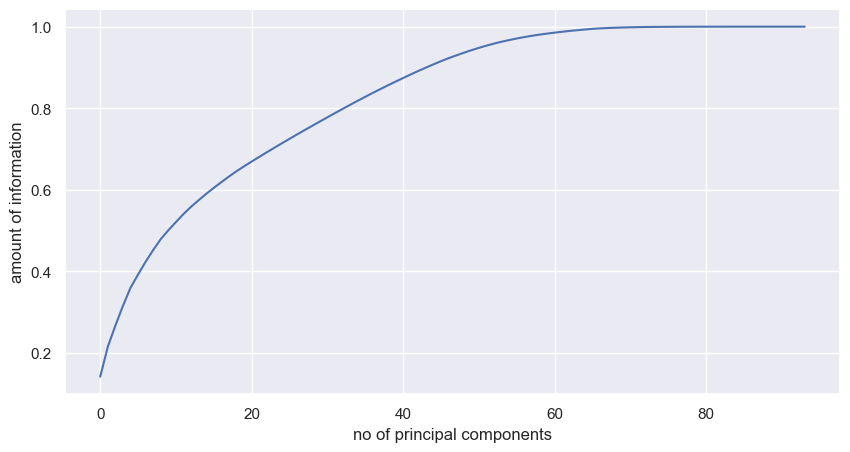

In [27]:
plt.figure(figsize=(10,5))

plt.plot(np.cumsum(pca1.explained_variance_ratio_))
plt.xlabel('no of principal components')
plt.ylabel('amount of information')
plt.show()

In [ ]:
# insight: we can choose 50 components and still retain 95% info

In [28]:
pca2=PCA(n_components=50)
x_train_sc_pca2=pca2.fit_transform(x_train_sc)

In [33]:
x_test_sc_pca2=pca2.transform(x_test_sc)

In [ ]:
# upsampling

In [35]:
from imblearn.over_sampling import SMOTE

In [37]:
smote=SMOTE(random_state=2)
x_train_sc_pca2_sm, y_train_sm=smote.fit_resample(x_train_sc_pca2, y_train)

In [39]:
x_train_sc_pca2_sm.shape, y_train_sm.shape   # 4949 of each class

((9898, 50), (9898,))

In [ ]:
# model building

In [ ]:
# base algos

In [47]:
logistic=LogisticRegression(random_state = 101)
rf=RandomForestClassifier(random_state=101)
svc=SVC(random_state=101)
xgbc=XGBClassifier(random_state=101)

In [48]:
p=[]
r=[]
model_list=[]

for model in [logistic, rf, svc, xgbc]:
    print('############'*3)
    print('performance of the model', model)
    print("#############"*3)
    
    model.fit(x_train_sc_pca2_sm, y_train_sm)
    y_pred_train = model.predict(x_train_sc_pca2_sm)
    cm_train=confusion_matrix(y_train_sm, y_pred_train)
    cr_train=classification_report(y_train_sm, y_pred_train)
    
    y_pred_test=model.predict(x_test_sc_pca2)
    cm_test=confusion_matrix(y_test, y_pred_test)
    cr_test=classification_report(y_test, y_pred_test)
    
    print('confusion matrix-train \n', cm_train)
    print('confusion matrix-test \n', cm_test)
    
    print('classifcation report-train \n', cr_train)
    print('classifcation report-test \n', cr_test)
    
    p.append(precision_score(y_test, y_pred_test))
    r.append(recall_score(y_test, y_pred_test))
    model_list.append(model)

####################################
performance of the model LogisticRegression(random_state=101)
#######################################
confusion matrix-train 
 [[4342  607]
 [ 492 4457]]
confusion matrix-test 
 [[1443  207]
 [  18   37]]
classifcation report-train 
               precision    recall  f1-score   support

           0       0.90      0.88      0.89      4949
           1       0.88      0.90      0.89      4949

    accuracy                           0.89      9898
   macro avg       0.89      0.89      0.89      9898
weighted avg       0.89      0.89      0.89      9898

classifcation report-test 
               precision    recall  f1-score   support

           0       0.99      0.87      0.93      1650
           1       0.15      0.67      0.25        55

    accuracy                           0.87      1705
   macro avg       0.57      0.77      0.59      1705
weighted avg       0.96      0.87      0.91      1705

####################################
performanc

In [ ]:
# insight:
# amongst the base algos in part B, svm gives the best results, logistic reg gives next best results wrt recall.

### Fine tuning SVM and LOGISTIC REGRESSION both here coz they both show vast difference in Precision and Recall between test and train:

- so i could have directly changed the threshold to improve Recall for the currently trained model, but tuning the model means making it learn better the diff between 0 and 1 and thereby reducing overfitting. However if am just changing the theshold in the currently trained model, then I am not improving the learning capacity of the model, i am simply tweaking the threshold values for labels. 

- so that is why i prefer to tune the model, to improve the Recall rather than just the threshold change

- will tune all the good models obtained in sections A, B, C and D for this same purpose, and then check the CV recall value of them to see how good they are on generalized data.

In [ ]:
# regularizing for logistic and changing C for svm to reduce the overfitting and tune for both better recall and precision

In [140]:
logistic=LogisticRegression(random_state = 101, C=0.001, penalty='l2', solver='lbfgs')



p=[]
r=[]
model_list=[]

for model in [logistic]:
    print('############'*3)
    print('performance of the model', model)
    print("#############"*3)
    
    model.fit(x_train_sc_pca2_sm, y_train_sm)
    y_pred_train = model.predict(x_train_sc_pca2_sm)
    cm_train=confusion_matrix(y_train_sm, y_pred_train)
    cr_train=classification_report(y_train_sm, y_pred_train)
    
    y_pred_test=model.predict(x_test_sc_pca2)
    cm_test=confusion_matrix(y_test, y_pred_test)
    cr_test=classification_report(y_test, y_pred_test)
    
    print('confusion matrix-train \n', cm_train)
    print('confusion matrix-test \n', cm_test)
    
    print('classifcation report-train \n', cr_train)
    print('classifcation report-test \n', cr_test)
    
    p.append(precision_score(y_test, y_pred_test))
    r.append(recall_score(y_test, y_pred_test))
    model_list.append(model)



####################################
performance of the model LogisticRegression(C=0.001, random_state=101)
#######################################
confusion matrix-train 
 [[4322  627]
 [ 542 4407]]
confusion matrix-test 
 [[1439  211]
 [  14   41]]
classifcation report-train 
               precision    recall  f1-score   support

           0       0.89      0.87      0.88      4949
           1       0.88      0.89      0.88      4949

    accuracy                           0.88      9898
   macro avg       0.88      0.88      0.88      9898
weighted avg       0.88      0.88      0.88      9898

classifcation report-test 
               precision    recall  f1-score   support

           0       0.99      0.87      0.93      1650
           1       0.16      0.75      0.27        55

    accuracy                           0.87      1705
   macro avg       0.58      0.81      0.60      1705
weighted avg       0.96      0.87      0.91      1705



In [ ]:
# tuning is not improving the precision. Only Recall has improved. But since Precision has not improved, we dont need this model

In [157]:
svc=SVC(random_state=101, C=0.01 , kernel='rbf', degree=3, gamma=0.1)





p=[]
r=[]
model_list=[]

for model in [svc]:
    print('############'*3)
    print('performance of the model', model)
    print("#############"*3)
    
    model.fit(x_train_sc_pca2_sm, y_train_sm)
    y_pred_train = model.predict(x_train_sc_pca2_sm)
    cm_train=confusion_matrix(y_train_sm, y_pred_train)
    cr_train=classification_report(y_train_sm, y_pred_train)
    
    y_pred_test=model.predict(x_test_sc_pca2)
    cm_test=confusion_matrix(y_test, y_pred_test)
    cr_test=classification_report(y_test, y_pred_test)
    
    print('confusion matrix-train \n', cm_train)
    print('confusion matrix-test \n', cm_test)
    
    print('classifcation report-train \n', cr_train)
    print('classifcation report-test \n', cr_test)
    
    p.append(precision_score(y_test, y_pred_test))
    r.append(recall_score(y_test, y_pred_test))
    model_list.append(model)



####################################
performance of the model SVC(C=0.01, gamma=0.1, random_state=101)
#######################################
confusion matrix-train 
 [[4725  224]
 [1998 2951]]
confusion matrix-test 
 [[1583   67]
 [  35   20]]
classifcation report-train 
               precision    recall  f1-score   support

           0       0.70      0.95      0.81      4949
           1       0.93      0.60      0.73      4949

    accuracy                           0.78      9898
   macro avg       0.82      0.78      0.77      9898
weighted avg       0.82      0.78      0.77      9898

classifcation report-test 
               precision    recall  f1-score   support

           0       0.98      0.96      0.97      1650
           1       0.23      0.36      0.28        55

    accuracy                           0.94      1705
   macro avg       0.60      0.66      0.63      1705
weighted avg       0.95      0.94      0.95      1705



In [186]:
svc=SVC(random_state=101, C=1 , kernel='poly', degree=2, gamma=0.01)


# gamma: used by rbf, poly, signmoid
# degree: used by poly only


p=[]
r=[]
model_list=[]

for model in [svc]:
    print('############'*3)
    print('performance of the model', model)
    print("#############"*3)
    
    model.fit(x_train_sc_pca2_sm, y_train_sm)
    y_pred_train = model.predict(x_train_sc_pca2_sm)
    cm_train=confusion_matrix(y_train_sm, y_pred_train)
    cr_train=classification_report(y_train_sm, y_pred_train)
    
    y_pred_test=model.predict(x_test_sc_pca2)
    cm_test=confusion_matrix(y_test, y_pred_test)
    cr_test=classification_report(y_test, y_pred_test)
    
    print('confusion matrix-train \n', cm_train)
    print('confusion matrix-test \n', cm_test)
    
    print('classifcation report-train \n', cr_train)
    print('classifcation report-test \n', cr_test)
    
    p.append(precision_score(y_test, y_pred_test))
    r.append(recall_score(y_test, y_pred_test))
    model_list.append(model)



####################################
performance of the model SVC(C=1, degree=2, gamma=0.01, kernel='poly', random_state=101)
#######################################
confusion matrix-train 
 [[4612  337]
 [ 544 4405]]
confusion matrix-test 
 [[1522  128]
 [  24   31]]
classifcation report-train 
               precision    recall  f1-score   support

           0       0.89      0.93      0.91      4949
           1       0.93      0.89      0.91      4949

    accuracy                           0.91      9898
   macro avg       0.91      0.91      0.91      9898
weighted avg       0.91      0.91      0.91      9898

classifcation report-test 
               precision    recall  f1-score   support

           0       0.98      0.92      0.95      1650
           1       0.19      0.56      0.29        55

    accuracy                           0.91      1705
   macro avg       0.59      0.74      0.62      1705
weighted avg       0.96      0.91      0.93      1705



In [ ]:
# weighted algos

In [70]:
logistic=LogisticRegression(random_state = 101, class_weight='balanced')
rf=RandomForestClassifier(random_state=101, class_weight='balanced')
svc=SVC(random_state=101, class_weight='balanced')
xgbc=XGBClassifier(random_state=101, class_weight='balanced')

In [71]:
p=[]
r=[]
model_list=[]

for model in [logistic, rf, svc, xgbc]:
    print('############'*3)
    print('performance of the model', model)
    print("#############"*3)
    
    model.fit(x_train_sc_pca2_sm, y_train_sm)
    y_pred_train = model.predict(x_train_sc_pca2_sm)
    cm_train=confusion_matrix(y_train_sm, y_pred_train)
    cr_train=classification_report(y_train_sm, y_pred_train)
    
    y_pred_test=model.predict(x_test_sc_pca2)
    cm_test=confusion_matrix(y_test, y_pred_test)
    cr_test=classification_report(y_test, y_pred_test)
    
    print('confusion matrix-train \n', cm_train)
    print('confusion matrix-test \n', cm_test)
    
    print('classifcation report-train \n', cr_train)
    print('classifcation report-test \n', cr_test)
    
    p.append(precision_score(y_test, y_pred_test))
    r.append(recall_score(y_test, y_pred_test))
    model_list.append(model)

####################################
performance of the model LogisticRegression(class_weight='balanced', random_state=101)
#######################################
confusion matrix-train 
 [[4342  607]
 [ 492 4457]]
confusion matrix-test 
 [[1443  207]
 [  18   37]]
classifcation report-train 
               precision    recall  f1-score   support

           0       0.90      0.88      0.89      4949
           1       0.88      0.90      0.89      4949

    accuracy                           0.89      9898
   macro avg       0.89      0.89      0.89      9898
weighted avg       0.89      0.89      0.89      9898

classifcation report-test 
               precision    recall  f1-score   support

           0       0.99      0.87      0.93      1650
           1       0.15      0.67      0.25        55

    accuracy                           0.87      1705
   macro avg       0.57      0.77      0.59      1705
weighted avg       0.96      0.87      0.91      1705

######################

# PART C: scaling-->PCA-->BorderlineSMOTE

In [51]:
from imblearn.over_sampling import BorderlineSMOTE

In [52]:
Bsmote=BorderlineSMOTE(random_state=2)
x_train_sc_pca2_Bsm, y_train_Bsm=Bsmote.fit_resample(x_train_sc_pca2, y_train)

In [ ]:
# model building

In [ ]:
# base algos

In [53]:
logistic=LogisticRegression(random_state = 101)
rf=RandomForestClassifier(random_state=101)
svc=SVC(random_state=101)
xgbc=XGBClassifier(random_state=101)

In [54]:
p=[]
r=[]
model_list=[]

for model in [logistic, rf, svc, xgbc]:
    print('############'*3)
    print('performance of the model', model)
    print("#############"*3)
    
    model.fit(x_train_sc_pca2_Bsm, y_train_Bsm)
    y_pred_train = model.predict(x_train_sc_pca2_Bsm)
    cm_train=confusion_matrix(y_train_Bsm, y_pred_train)
    cr_train=classification_report(y_train_Bsm, y_pred_train)
    
    y_pred_test=model.predict(x_test_sc_pca2)
    cm_test=confusion_matrix(y_test, y_pred_test)
    cr_test=classification_report(y_test, y_pred_test)
    
    print('confusion matrix-train \n', cm_train)
    print('confusion matrix-test \n', cm_test)
    
    print('classifcation report-train \n', cr_train)
    print('classifcation report-test \n', cr_test)
    
    p.append(precision_score(y_test, y_pred_test))
    r.append(recall_score(y_test, y_pred_test))
    model_list.append(model)

####################################
performance of the model LogisticRegression(random_state=101)
#######################################
confusion matrix-train 
 [[4473  476]
 [ 268 4681]]
confusion matrix-test 
 [[1488  162]
 [  20   35]]
classifcation report-train 
               precision    recall  f1-score   support

           0       0.94      0.90      0.92      4949
           1       0.91      0.95      0.93      4949

    accuracy                           0.92      9898
   macro avg       0.93      0.92      0.92      9898
weighted avg       0.93      0.92      0.92      9898

classifcation report-test 
               precision    recall  f1-score   support

           0       0.99      0.90      0.94      1650
           1       0.18      0.64      0.28        55

    accuracy                           0.89      1705
   macro avg       0.58      0.77      0.61      1705
weighted avg       0.96      0.89      0.92      1705

####################################
performanc

In [ ]:
# weighted algos

In [55]:
logistic=LogisticRegression(random_state = 101, class_weight='balanced')
rf=RandomForestClassifier(random_state=101, class_weight='balanced')
svc=SVC(random_state=101, class_weight='balanced')
xgbc=XGBClassifier(random_state=101, class_weight='balanced')

In [56]:
p=[]
r=[]
model_list=[]

for model in [logistic, rf, svc, xgbc]:
    print('############'*3)
    print('performance of the model', model)
    print("#############"*3)
    
    model.fit(x_train_sc_pca2_Bsm, y_train_Bsm)
    y_pred_train = model.predict(x_train_sc_pca2_Bsm)
    cm_train=confusion_matrix(y_train_Bsm, y_pred_train)
    cr_train=classification_report(y_train_Bsm, y_pred_train)
    
    y_pred_test=model.predict(x_test_sc_pca2)
    cm_test=confusion_matrix(y_test, y_pred_test)
    cr_test=classification_report(y_test, y_pred_test)
    
    print('confusion matrix-train \n', cm_train)
    print('confusion matrix-test \n', cm_test)
    
    print('classifcation report-train \n', cr_train)
    print('classifcation report-test \n', cr_test)
    
    p.append(precision_score(y_test, y_pred_test))
    r.append(recall_score(y_test, y_pred_test))
    model_list.append(model)

####################################
performance of the model LogisticRegression(class_weight='balanced', random_state=101)
#######################################
confusion matrix-train 
 [[4473  476]
 [ 268 4681]]
confusion matrix-test 
 [[1488  162]
 [  20   35]]
classifcation report-train 
               precision    recall  f1-score   support

           0       0.94      0.90      0.92      4949
           1       0.91      0.95      0.93      4949

    accuracy                           0.92      9898
   macro avg       0.93      0.92      0.92      9898
weighted avg       0.93      0.92      0.92      9898

classifcation report-test 
               precision    recall  f1-score   support

           0       0.99      0.90      0.94      1650
           1       0.18      0.64      0.28        55

    accuracy                           0.89      1705
   macro avg       0.58      0.77      0.61      1705
weighted avg       0.96      0.89      0.92      1705

######################

### Checking multicollinearity of pca data

In [73]:
x_train_sc_pca2_df=pd.DataFrame(data=x_train_sc_pca2)

In [74]:
corr_after_pca=x_train_sc_pca2_df.corr(method='spearman')
corr_after_pca

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49
0,1.000000,-0.176050,-0.139137,0.120616,-0.186546,0.006039,-0.059068,-0.083163,-0.028041,0.120777,0.062416,0.005232,-0.014990,0.011465,-0.117398,-0.041936,-0.176267,-0.076894,-0.044359,-0.025658,-0.085901,0.068170,0.080348,0.023653,-0.032906,0.045909,0.020437,0.114487,-0.040326,0.021656,-0.009794,-0.066410,0.186711,0.075256,-0.086126,0.047401,-0.003475,-0.064757,-0.007164,-0.034222,0.022622,-0.055220,0.039458,-0.052892,-0.005216,-0.110943,-0.013780,-0.073287,0.134273,-0.049113
1,-0.176050,1.000000,-0.672061,0.145853,0.316400,0.128753,-0.016654,-0.053163,-0.111500,-0.021565,-0.063186,-0.043475,-0.114708,-0.131179,0.000144,0.195393,-0.011983,-0.126956,-0.062509,-0.014669,-0.097996,-0.108229,-0.119141,0.079118,-0.012206,-0.022268,0.030693,0.039181,0.000719,-0.004879,-0.072550,-0.003707,-0.027569,-0.049004,0.119498,-0.005493,-0.093281,-0.057032,0.032015,0.051253,0.030953,-0.067030,0.040535,0.074212,0.002289,-0.130830,-0.010917,-0.017449,-0.003994,-0.038568
2,-0.139137,-0.672061,1.000000,0.209405,-0.597911,0.122511,0.109452,-0.178330,-0.115030,0.124067,0.103175,-0.061528,0.180033,0.104328,-0.042774,-0.106111,0.043782,0.036294,0.043021,0.043993,0.058951,0.041460,0.133226,-0.111170,0.049796,0.068684,-0.045889,-0.014190,0.016132,0.016209,0.112635,-0.046770,-0.099979,0.011912,-0.070489,0.002236,-0.005023,0.115952,0.048825,-0.030478,-0.055139,-0.001154,-0.066999,-0.028323,-0.024071,0.053316,0.012923,0.109790,-0.047340,-0.003288
3,0.120616,0.145853,0.209405,1.000000,-0.797385,0.030154,-0.197992,-0.054687,-0.025879,0.076117,0.063640,-0.064040,0.136810,-0.146089,0.072215,0.073475,-0.051296,-0.020059,-0.127349,-0.044464,-0.055837,0.001685,0.043963,-0.027626,-0.056741,-0.062379,-0.121332,-0.029430,0.076442,0.005015,0.044524,-0.021009,-0.114078,0.072105,0.011878,-0.035926,0.008970,0.046638,0.015938,-0.043367,0.013407,0.001738,0.066731,0.019433,0.014987,-0.024305,0.036817,-0.053607,-0.075256,-0.018990
4,-0.186546,0.316400,-0.597911,-0.797385,1.000000,-0.092946,0.222354,0.155935,-0.044034,-0.023375,-0.025224,0.124228,-0.149892,-0.019946,0.020151,-0.045310,0.003953,0.032561,0.074614,0.057509,-0.033200,-0.040813,-0.040421,0.055467,0.006736,0.084394,0.097724,0.054174,-0.056516,-0.011697,-0.105074,-0.024932,0.172993,-0.130129,-0.002160,0.045655,-0.059089,-0.112171,-0.041786,0.041652,0.001096,-0.011652,-0.044671,-0.011877,-0.009431,-0.015545,-0.057340,-0.000945,-0.008476,0.000892
5,0.006039,0.128753,0.122511,0.030154,-0.092946,1.000000,-0.170031,-0.741283,0.020863,-0.013247,0.049988,-0.054013,0.007594,0.085559,0.012069,-0.126738,-0.247732,0.141899,-0.072749,0.041935,-0.027769,0.048205,0.044832,-0.064201,0.059308,0.064866,0.026062,0.032890,0.027496,0.097879,-0.026849,-0.048033,-0.037269,-0.016620,-0.047932,0.072142,-0.109726,0.052110,0.056985,-0.065459,0.029043,0.045639,0.016244,0.029678,-0.020892,-0.144613,0.086566,-0.098114,0.188933,0.016741
6,-0.059068,-0.016654,0.109452,-0.197992,0.222354,-0.170031,1.000000,-0.122974,-0.852880,-0.023571,0.143223,0.133363,-0.192341,0.077630,-0.134254,0.191540,-0.098225,-0.251771,-0.146107,0.055388,-0.016296,-0.052539,0.043821,0.033185,-0.029020,0.134431,0.001620,0.151788,-0.082553,0.080543,-0.079869,-0.160410,0.111170,-0.032230,-0.078313,-0.051039,0.006934,-0.028611,0.033210,-0.019982,-0.113202,-0.033739,-0.050138,-0.047519,-0.094086,0.152463,-0.102356,0.033019,-0.061841,-0.052101
7,-0.083163,-0.053163,-0.178330,-0.054687,0.155935,-0.741283,-0.122974,1.000000,0.271329,0.099478,0.045799,0.299015,-0.082035,0.045612,-0.158020,-0.021030,0.205804,-0.079911,0.168983,-0.020794,0.009570,-0.030809,0.016341,-0.018646,-0.034620,-0.045128,0.121299,-0.033612,-0.084707,-0.065487,0.084892,0.035838,-0.014468,-0.091530,0.061094,-0.025712,0.009503,-0.058944,-0.062637,0.052997,0.012668,-0.009076,-0.066281,-0.019082,0.039012,0.069228,0.016935,0.001265,-0.238373,-0.027214
8,-0.028041,-0.111500,-0

In [75]:
corr_after_pca.shape

(50, 50)

In [76]:
high_corr=[]
list_index=[]
list_col=[]
for i in range(len(corr_after_pca)):
    for j in range(0,i):
#        print(corr.loc[i,j])
        if (corr_after_pca.iloc[i,j]>0.75 and corr_after_pca.iloc[i,j]<1) or (corr_after_pca.iloc[i,j]<-0.75 and corr_after_pca.iloc[i,j]>-1):
            high_corr.append(corr_after_pca.iloc[i,j])
            list_index.append(corr_after_pca.columns[i])
            list_col.append(corr_after_pca.columns[j])
        
        
high_corr_df_pca=pd.DataFrame({'var1': list_index, 'var2':list_col, 'corr': high_corr})
high_corr_df_pca
        

,var1,var2,corr
0,4,3,-0.797385
1,8,6,-0.852880


In [ ]:
# insight: 


#  multicollinearity has been removed significantly after pca

### checking multicollinearity after SMOTE

In [77]:
x_train_sc_pca2_sm_df=pd.DataFrame(data=x_train_sc_pca2_sm)

In [78]:
corr_after_pca_sm=x_train_sc_pca2_sm_df.corr(method='spearman')
corr_after_pca_sm

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49
0,1.000000,-0.011763,-0.145939,-0.046203,0.013312,0.246748,0.029149,-0.090224,-0.099490,0.435848,0.225952,0.322343,0.160822,0.070408,-0.267548,-0.208755,-0.321091,-0.192785,-0.024372,0.030726,-0.024728,0.034261,0.082889,-0.105196,0.142683,-0.017471,0.164022,0.085039,-0.160764,0.119807,-0.027313,-0.035294,0.271841,0.016980,-0.093478,0.164541,-0.199089,-0.288755,-0.038160,-0.127128,0.199514,0.095240,0.102962,0.165081,-0.044821,-0.167501,-0.222021,-0.087827,0.194210,0.067385
1,-0.011763,1.000000,-0.371299,0.031645,0.173780,0.155572,-0.002561,-0.101289,-0.082516,-0.018894,0.116464,-0.150639,-0.239864,-0.161189,-0.095667,0.033463,-0.054553,-0.171402,0.005769,0.054068,-0.087907,-0.190184,-0.016770,-0.034449,-0.060481,0.069629,-0.071846,0.059553,0.017722,-0.065586,-0.099780,-0.169730,-0.160309,-0.196791,0.181545,-0.006359,-0.187424,-0.031722,0.063208,0.113362,0.056978,-0.093168,-0.022681,0.023913,-0.094035,-0.152536,0.071374,0.071648,-0.043771,-0.167620
2,-0.145939,-0.371299,1.000000,0.322972,-0.667411,0.110787,0.029285,-0.214253,-0.015011,0.048315,-0.049702,-0.162549,0.084445,0.065254,0.062228,-0.061275,-0.004812,0.105575,0.082169,0.069950,-0.020967,0.092334,0.129941,-0.071810,-0.027970,0.120506,-0.204009,-0.019479,0.100683,-0.038005,0.074539,-0.132891,-0.110087,-0.014522,-0.048579,-0.002331,0.163441,0.153358,0.031950,-0.106143,-0.131441,0.025288,-0.156708,-0.139096,-0.068545,0.044407,0.069507,-0.041432,-0.192336,0.054396
3,-0.046203,0.031645,0.322972,1.000000,-0.802622,0.192140,-0.192209,-0.229791,0.011583,0.029398,0.132838,-0.174246,-0.060834,-0.188526,0.262899,0.044792,0.026254,0.053298,-0.062780,0.152322,-0.090761,0.138897,0.160276,-0.042887,-0.167596,0.118197,-0.244416,0.039692,0.219185,-0.016427,-0.016225,-0.226270,-0.094707,-0.030786,0.021433,0.076114,0.119396,0.044678,0.166113,-0.140311,-0.088156,-0.085721,-0.070187,-0.260021,0.038352,-0.096707,0.034293,-0.108873,-0.312055,0.101206
4,0.013312,0.173780,-0.667411,-0.802622,1.000000,-0.146490,0.248862,0.241786,-0.136143,0.036304,0.017522,0.243511,0.020546,0.017153,-0.135085,-0.010155,-0.017005,-0.065405,0.036875,-0.112526,0.057168,-0.183295,-0.148745,0.049953,0.073304,-0.070493,0.237932,-0.005157,-0.197042,0.041493,-0.029696,0.181729,0.124180,-0.011406,-0.016403,-0.039437,-0.203252,-0.110197,-0.143545,0.129941,0.111815,0.056422,0.101057,0.255459,-0.011601,0.082676,-0.055513,0.101062,0.234666,-0.107421
5,0.246748,0.155572,0.110787,0.192140,-0.146490,1.000000,-0.087107,-0.746627,-0.051879,0.061969,0.268028,0.147546,0.035690,-0.033549,0.090253,-0.192370,-0.298847,0.033439,-0.021256,0.080587,-0.041811,0.086394,0.140607,-0.191110,-0.055047,0.098990,0.038889,0.094889,0.014590,0.113738,-0.034946,-0.152841,0.019387,-0.047388,-0.116226,0.062763,-0.194900,0.078222,0.077209,-0.073850,0.068258,0.020831,0.088055,0.041911,0.038809,-0.086848,0.036187,-0.235666,0.009767,0.075389
6,0.029149,-0.002561,0.029285,-0.192209,0.248862,-0.087107,1.000000,-0.157514,-0.815253,0.022613,0.231531,0.172983,-0.178079,-0.031707,-0.072916,0.080110,-0.137375,-0.176401,-0.133782,0.001518,-0.085910,-0.148786,-0.016923,0.036939,0.054560,0.095827,0.013457,0.103012,-0.050306,0.104225,-0.086821,-0.089729,0.080791,-0.014068,-0.027502,-0.109252,-0.108185,-0.096828,0.050523,-0.019647,-0.133842,-0.019082,-0.031879,0.034608,-0.107150,0.060847,-0.084459,0.033110,0.012583,-0.120158
7,-0.090224,-0.101289,-0.214253,-0.229791,0.241786,-0.746627,-0.157514,1.000000,0.248928,0.096126,-0.106039,0.088029,-0.086396,0.134179,-0.249256,0.023375,0.222265,-0.024351,0.058357,-0.033946,0.079908,-0.097803,-0.093622,0.084174,0.055625,-0.086966,0.102852,-0.116221,-0.093046,-0.022586,0.086617,0.113611,-0.056951,-0.068799,0.039636,0.027999,0.060387,-0.107599,-0.118407,0.034088,0.047901,0.097960,-0.098388,-0.004432,0.035321,0.063337,-0.030061,0.165324,0.000011,-0.092782
8,-0.099490,-0.082516,-0.015011,0.011

In [79]:
corr_after_pca_sm.shape

(50, 50)

In [80]:
high_corr=[]
list_index=[]
list_col=[]
for i in range(len(corr_after_pca_sm)):
    for j in range(0,i):
#        print(corr.loc[i,j])
        if (corr_after_pca_sm.iloc[i,j]>0.75 and corr_after_pca_sm.iloc[i,j]<1) or (corr_after_pca_sm.iloc[i,j]<-0.75 and corr_after_pca_sm.iloc[i,j]>-1):
            high_corr.append(corr_after_pca_sm.iloc[i,j])
            list_index.append(corr_after_pca_sm.columns[i])
            list_col.append(corr_after_pca_sm.columns[j])
        
        
high_corr_df_pca_sm=pd.DataFrame({'var1': list_index, 'var2':list_col, 'corr': high_corr})
high_corr_df_pca_sm
        

,var1,var2,corr
0,4,3,-0.802622
1,8,6,-0.815253


In [ ]:
# insight:

# no significant increase in multicollinearity from that observed after doing pca

### checking multicollinearity after BorderlineSMOTE

In [ ]:
x_train_sc_pca2_Bsm

In [81]:
x_train_sc_pca2_Bsm_df=pd.DataFrame(data=x_train_sc_pca2_Bsm)

In [82]:
corr_after_pca_Bsm=x_train_sc_pca2_Bsm_df.corr(method='spearman')
corr_after_pca_Bsm

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49
0,1.000000,-0.022613,-0.140957,-0.027031,0.013224,0.279458,0.008237,-0.120157,-0.070444,0.447472,0.215659,0.341877,0.179890,0.067995,-0.303288,-0.177772,-0.368792,-0.160463,0.041600,0.096981,-0.092688,0.049970,0.125579,-0.119220,0.135933,-0.008387,0.163105,0.135515,-0.121343,0.126323,-0.000006,-0.029386,0.256008,0.035988,-0.089870,0.140011,-0.212878,-0.283472,-0.005733,-0.159129,0.141335,0.118535,0.053095,0.182934,-0.099423,-0.168815,-0.247448,-0.120072,0.209615,0.081654
1,-0.022613,1.000000,-0.389644,0.015202,0.193706,0.183470,0.041264,-0.190361,-0.153983,-0.042704,0.084682,-0.193158,-0.202046,-0.145106,-0.103843,0.118307,-0.014895,-0.216430,0.062388,0.064066,-0.071434,-0.208715,-0.040180,0.010302,-0.041362,0.067726,-0.089675,0.078890,0.043272,-0.142608,-0.090209,-0.154204,-0.167267,-0.195407,0.251221,-0.007538,-0.200141,0.032456,0.124832,0.179244,0.050737,-0.138157,-0.040309,-0.004526,-0.101362,-0.168848,0.080502,0.059290,-0.077972,-0.161552
2,-0.140957,-0.389644,1.000000,0.348954,-0.655512,0.164990,0.027838,-0.252621,-0.026018,0.051456,-0.015652,-0.131553,0.117950,0.025361,0.060564,-0.106552,0.000334,0.108057,0.084986,0.049443,-0.004075,0.113932,0.137161,-0.066125,-0.034557,0.136225,-0.206281,-0.023742,0.086259,0.001875,0.106028,-0.155819,-0.100776,-0.052340,-0.104189,0.021550,0.121377,0.136574,-0.002817,-0.139978,-0.133980,0.047154,-0.174994,-0.145061,-0.038201,0.037607,0.045506,-0.061712,-0.201966,0.112168
3,-0.027031,0.015202,0.348954,1.000000,-0.836462,0.182467,-0.218179,-0.167223,0.031593,0.032436,0.146952,-0.141074,-0.059883,-0.174149,0.262019,-0.010103,0.051103,0.038885,-0.099070,0.111369,-0.054832,0.129192,0.118135,-0.015376,-0.126725,0.120829,-0.222899,0.046525,0.201470,0.040442,-0.004071,-0.222770,-0.079346,-0.075454,-0.049051,0.109779,0.116156,0.046562,0.145437,-0.179454,-0.049426,-0.042888,-0.067828,-0.286334,0.085165,-0.079570,-0.038202,-0.094442,-0.316329,0.178721
4,0.013224,0.193706,-0.655512,-0.836462,1.000000,-0.173071,0.246984,0.235276,-0.129403,0.032123,-0.022603,0.212648,0.015333,0.057995,-0.133934,0.045714,-0.025039,-0.049573,0.054680,-0.065374,0.022874,-0.168997,-0.140812,0.048230,0.047936,-0.093698,0.220914,0.009798,-0.164748,-0.002958,-0.031236,0.212193,0.111971,0.063056,0.022680,-0.068161,-0.175584,-0.067981,-0.105373,0.178885,0.099460,0.027456,0.134885,0.294523,-0.052103,0.078217,-0.017082,0.095387,0.213082,-0.147532
5,0.279458,0.183470,0.164990,0.182467,-0.173071,1.000000,-0.102312,-0.736160,-0.036898,0.054696,0.271860,0.172731,0.024675,-0.067098,0.056616,-0.233479,-0.339955,0.036044,-0.026330,0.077823,-0.063515,0.070259,0.162250,-0.227984,-0.053244,0.106695,0.040776,0.131264,0.024164,0.118570,-0.093968,-0.184069,-0.017881,-0.083705,-0.131857,0.037462,-0.225304,0.122377,0.076817,-0.112885,0.057596,0.050346,0.050388,0.052988,0.018174,-0.102898,0.037890,-0.210887,0.003568,0.085816
6,0.008237,0.041264,0.027838,-0.218179,0.246984,-0.102312,1.000000,-0.154557,-0.807861,-0.000951,0.245528,0.186491,-0.202593,-0.052173,-0.082889,0.079527,-0.186874,-0.183103,-0.149546,0.035138,-0.111967,-0.140005,0.003810,0.019228,0.066968,0.094344,0.013403,0.129157,-0.032830,0.095349,-0.089513,-0.104378,0.054009,-0.025062,-0.029018,-0.143546,-0.127272,-0.079472,0.056984,-0.030247,-0.165994,-0.030013,-0.025298,0.045256,-0.109045,0.009530,-0.091189,0.045929,-0.017161,-0.124283
7,-0.120157,-0.190361,-0.252621,-0.167223,0.235276,-0.736160,-0.154557,1.000000,0.219216,0.113407,-0.114108,0.047765,-0.082828,0.177289,-0.188668,0.086281,0.295221,-0.027802,0.071976,-0.006747,0.093450,-0.067549,-0.098419,0.133807,0.016011,-0.069129,0.100437,-0.126179,-0.087059,-0.027419,0.140217,0.128870,-0.025714,-0.006670,0.046010,0.075610,0.098246,-0.119324,-0.096616,0.062205,0.056834,0.062950,-0.082829,-0.035725,0.057578,0.081925,-0.024879,0.126825,-0.015025,-0.078339
8,-0.070444,-0.153983,-0.026018,0.031593

In [83]:
corr_after_pca_Bsm.shape

(50, 50)

In [84]:
high_corr=[]
list_index=[]
list_col=[]
for i in range(len(corr_after_pca_Bsm)):
    for j in range(0,i):
#        print(corr.loc[i,j])
        if (corr_after_pca_Bsm.iloc[i,j]>0.75 and corr_after_pca_Bsm.iloc[i,j]<1) or (corr_after_pca_Bsm.iloc[i,j]<-0.75 and corr_after_pca_Bsm.iloc[i,j]>-1):
            high_corr.append(corr_after_pca_Bsm.iloc[i,j])
            list_index.append(corr_after_pca_Bsm.columns[i])
            list_col.append(corr_after_pca_Bsm.columns[j])
        
        
high_corr_df_pca_Bsm=pd.DataFrame({'var1': list_index, 'var2':list_col, 'corr': high_corr})
high_corr_df_pca_Bsm
        

,var1,var2,corr
0,4,3,-0.836462
1,8,6,-0.807861


In [ ]:
# insight:

# no significant increase in multicollinearity from that observed after doing pca

# PART D: upsampling--> scaling --> pca

In [ ]:
# no need to do this as upsampling did not lead to any increase in multicollinearity after doing pca. So doing things in reverse also wont be helpful.
# but still need to check whether doing SMOTE on the original data rather than on the pca data is more helpful for retaining the original patterns and giving better results for the test data i.e more generalized result for test set as when we do pca--> smote, we get overfit models and only the recall is high.

In [ ]:
# upsampling using SMOTE

In [35]:
from imblearn.over_sampling import SMOTE

In [104]:
smote=SMOTE(random_state=2)
x_train_sm_new, y_train_sm_new = smote.fit_resample(x_train, y_train)

In [105]:
x_train_sm_new.shape, y_train_sm_new.shape   # 4949 of each class

((9898, 94), (9898,))

In [ ]:
# scaling

In [ ]:
# standardizing

In [106]:
from sklearn.preprocessing import StandardScaler

In [107]:
sc=StandardScaler()
x_train_sm_sc_new=sc.fit_transform(x_train_sm_new)

In [111]:
x_test_sc_new=sc.transform(x_test)

In [ ]:
# pca

In [108]:
pca_new_1=PCA()
x_train_sm_sc_pca_new_1=pca_new_1.fit_transform(x_train_sm_sc_new)

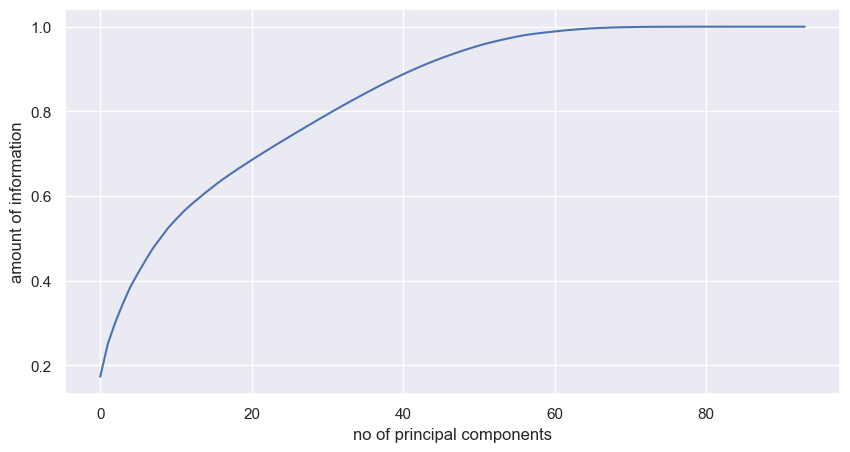

In [109]:
plt.figure(figsize=(10,5))

plt.plot(np.cumsum(pca_new_1.explained_variance_ratio_))
plt.xlabel('no of principal components')
plt.ylabel('amount of information')
plt.show()

In [ ]:
# insight: we can choose 50 components and still retain 95% info

In [110]:
pca_new_2=PCA(n_components=50)
x_train_sm_sc_pca_new_2=pca_new_2.fit_transform(x_train_sm_sc_new)

In [112]:
x_test_sc_pca_new_2=pca_new_2.transform(x_test_sc_new)

In [ ]:
# base algos

In [113]:
logistic=LogisticRegression(random_state = 101)
rf=RandomForestClassifier(random_state=101)
svc=SVC(random_state=101)
xgbc=XGBClassifier(random_state=101)

In [114]:
p=[]
r=[]
model_list=[]

for model in [logistic, rf, svc, xgbc]:
    print('############'*3)
    print('performance of the model', model)
    print("#############"*3)
    
    model.fit(x_train_sm_sc_pca_new_2, y_train_sm_new)
    y_pred_train = model.predict(x_train_sm_sc_pca_new_2)
    cm_train=confusion_matrix(y_train_sm_new, y_pred_train)
    cr_train=classification_report(y_train_sm_new, y_pred_train)
    
    y_pred_test=model.predict(x_test_sc_pca_new_2)
    cm_test=confusion_matrix(y_test, y_pred_test)
    cr_test=classification_report(y_test, y_pred_test)
    
    print('confusion matrix-train \n', cm_train)
    print('confusion matrix-test \n', cm_test)
    
    print('classifcation report-train \n', cr_train)
    print('classifcation report-test \n', cr_test)
    
    p.append(precision_score(y_test, y_pred_test))
    r.append(recall_score(y_test, y_pred_test))
    model_list.append(model)

####################################
performance of the model LogisticRegression(random_state=101)
#######################################
confusion matrix-train 
 [[4399  550]
 [ 382 4567]]
confusion matrix-test 
 [[1468  182]
 [  17   38]]
classifcation report-train 
               precision    recall  f1-score   support

           0       0.92      0.89      0.90      4949
           1       0.89      0.92      0.91      4949

    accuracy                           0.91      9898
   macro avg       0.91      0.91      0.91      9898
weighted avg       0.91      0.91      0.91      9898

classifcation report-test 
               precision    recall  f1-score   support

           0       0.99      0.89      0.94      1650
           1       0.17      0.69      0.28        55

    accuracy                           0.88      1705
   macro avg       0.58      0.79      0.61      1705
weighted avg       0.96      0.88      0.92      1705

####################################
performanc

In [ ]:
# insight: 
# all are overfit models

# PART E: scaling--> pca--> undesampling

In [118]:
from imblearn.under_sampling import RandomUnderSampler

In [119]:
under_samp=RandomUnderSampler(random_state=2)
x_train_sc_pca2_under, y_train_under=under_samp.fit_resample(x_train_sc_pca2, y_train)

In [ ]:
# base algos

In [120]:
logistic=LogisticRegression(random_state = 101)
rf=RandomForestClassifier(random_state=101)
svc=SVC(random_state=101)
xgbc=XGBClassifier(random_state=101)

In [121]:
p=[]
r=[]
model_list=[]

for model in [logistic, rf, svc, xgbc]:
    print('############'*3)
    print('performance of the model', model)
    print("#############"*3)
    
    model.fit(x_train_sc_pca2_under, y_train_under)
    y_pred_train = model.predict(x_train_sc_pca2_under)
    cm_train=confusion_matrix(y_train_under, y_pred_train)
    cr_train=classification_report(y_train_under, y_pred_train)
    
    y_pred_test=model.predict(x_test_sc_pca2)
    cm_test=confusion_matrix(y_test, y_pred_test)
    cr_test=classification_report(y_test, y_pred_test)
    
    print('confusion matrix-train \n', cm_train)
    print('confusion matrix-test \n', cm_test)
    
    print('classifcation report-train \n', cr_train)
    print('classifcation report-test \n', cr_test)
    
    p.append(precision_score(y_test, y_pred_test))
    r.append(recall_score(y_test, y_pred_test))
    model_list.append(model)

####################################
performance of the model LogisticRegression(random_state=101)
#######################################
confusion matrix-train 
 [[148  17]
 [ 17 148]]
confusion matrix-test 
 [[1383  267]
 [  15   40]]
classifcation report-train 
               precision    recall  f1-score   support

           0       0.90      0.90      0.90       165
           1       0.90      0.90      0.90       165

    accuracy                           0.90       330
   macro avg       0.90      0.90      0.90       330
weighted avg       0.90      0.90      0.90       330

classifcation report-test 
               precision    recall  f1-score   support

           0       0.99      0.84      0.91      1650
           1       0.13      0.73      0.22        55

    accuracy                           0.83      1705
   macro avg       0.56      0.78      0.56      1705
weighted avg       0.96      0.83      0.89      1705

####################################
performance of

In [ ]:
# exceptionally high recall found on undersampling

In [ ]:
# CV score on recall

In [230]:
from sklearn.model_selection import cross_val_score

rf=RandomForestClassifier(random_state=101)
cv_rf=cross_val_score(rf, x_train_sc_pca2_under, y_train_under, cv=5, scoring='recall')
print(cv_rf)
print(cv_rf.mean())

[0.90909091 0.84848485 0.72727273 0.90909091 0.90909091]
0.8606060606060606


### changing threshold to obtain better precision- recall tradeoff for the model with highest recall

In [218]:


def threshold_change(model):
    
    # fitting the model
    xyz=model.fit(x_train_sc_pca2_under, y_train_under)


    # probabilities
    y_proba=model.predict_proba(x_test_sc_pca2)[:,1]

    

    # defining a func to generate new new-class labels based on new threshold
    def new_class(y_proba, thresh):
        y_pred_new=[1 if y>thresh else 0 for y in y_proba]
        return y_pred_new


    
    #calculating new precision and recall for new threshold
    p=[]
    r=[]
    t=[]
    for i in np.arange(0,1,0.05):
        y_pred_new_class=new_class(y_proba, i) #generating new new-class labels based on new threshold
        precision=precision_score(y_test, y_pred_new_class)
        recall=recall_score(y_test, y_pred_new_class)
        p.append(precision)
        r.append(recall)
        t.append(i)
        if precision>0.60 and recall>0.65:
            print(thresh)
        
        
        
    # precision and recall mterics
    metrics=pd.DataFrame({'precision':p,'recall':r,'threshold':t})
    print(metrics)


    # plot precision-recall curve
    from sklearn.metrics import precision_recall_curve
    pre, re, th=precision_recall_curve(y_test,y_proba)
    plt.plot(re, pre, marker='o')
    plt.xlabel('recall')
    plt.ylabel('precision')
    plt.title('precision-recall curve')
    plt.show()
        

In [ ]:
logistic=LogisticRegression(random_state = 101)
rf=RandomForestClassifier(random_state=101)
svc=SVC(random_state=101)
xgbc=XGBClassifier(random_state=101)

    precision    recall  threshold
0    0.032277  1.000000       0.00
1    0.065513  0.963636       0.05
2    0.075780  0.927273       0.10
3    0.087629  0.927273       0.15
4    0.093204  0.872727       0.20
5    0.099338  0.818182       0.25
6    0.105263  0.800000       0.30
7    0.106599  0.763636       0.35
8    0.111717  0.745455       0.40
9    0.119883  0.745455       0.45
10   0.130293  0.727273       0.50
11   0.131313  0.709091       0.55
12   0.141791  0.690909       0.60
13   0.152263  0.672727       0.65
14   0.160000  0.654545       0.70
15   0.168317  0.618182       0.75
16   0.162011  0.527273       0.80
17   0.177632  0.490909       0.85
18   0.193277  0.418182       0.90
19   0.241758  0.400000       0.95


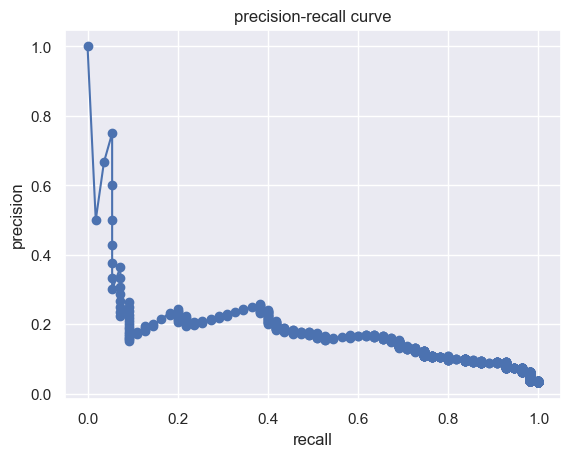

In [219]:
# LR
logistic=LogisticRegression(random_state = 101)
threshold_change(logistic)

    precision    recall  threshold
0    0.032258  1.000000       0.00
1    0.032335  0.981818       0.05
2    0.035310  0.963636       0.10
3    0.041864  0.963636       0.15
4    0.051707  0.963636       0.20
5    0.062954  0.945455       0.25
6    0.078431  0.945455       0.30
7    0.090239  0.890909       0.35
8    0.103226  0.872727       0.40
9    0.119171  0.836364       0.45
10   0.138554  0.836364       0.50
11   0.152416  0.745455       0.55
12   0.168224  0.654545       0.60
13   0.190476  0.581818       0.65
14   0.191667  0.418182       0.70
15   0.234568  0.345455       0.75
16   0.268293  0.200000       0.80
17   0.384615  0.090909       0.85
18   0.400000  0.036364       0.90
19   0.000000  0.000000       0.95


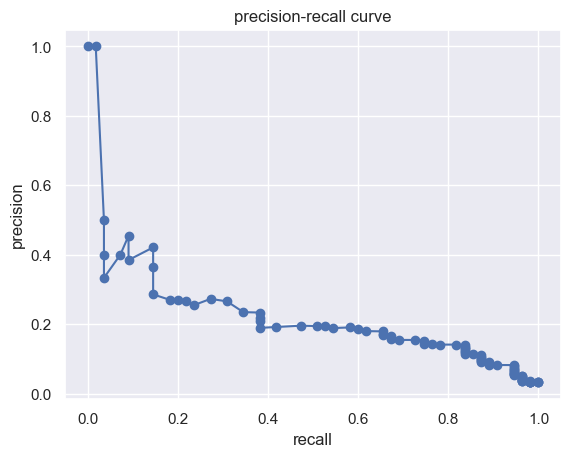

In [220]:
# RF
rf=RandomForestClassifier(random_state=101)
threshold_change(rf)

    precision    recall  threshold
0    0.032258  1.000000       0.00
1    0.050139  0.981818       0.05
2    0.065455  0.981818       0.10
3    0.080119  0.981818       0.15
4    0.086882  0.927273       0.20
5    0.097087  0.909091       0.25
6    0.106754  0.890909       0.30
7    0.119221  0.890909       0.35
8    0.131868  0.872727       0.40
9    0.145455  0.872727       0.45
10   0.155709  0.818182       0.50
11   0.160305  0.763636       0.55
12   0.167364  0.727273       0.60
13   0.168224  0.654545       0.65
14   0.166667  0.581818       0.70
15   0.179191  0.563636       0.75
16   0.198675  0.545455       0.80
17   0.206612  0.454545       0.85
18   0.275362  0.345455       0.90
19   0.433333  0.236364       0.95


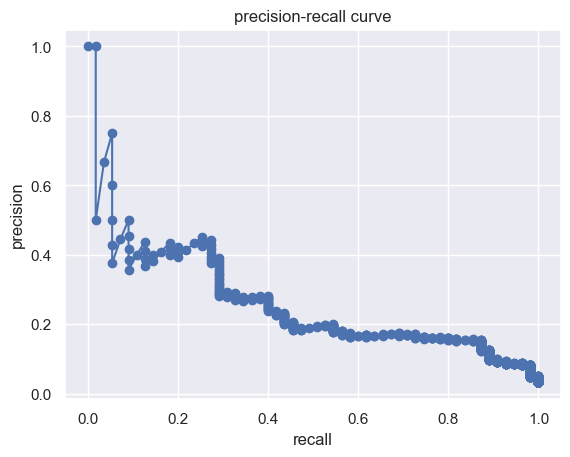

In [222]:
# svc

svc=SVC(random_state=101, probability=True)
threshold_change(svc)

    precision    recall  threshold
0    0.032258  1.000000       0.00
1    0.088136  0.945455       0.05
2    0.095238  0.872727       0.10
3    0.102345  0.872727       0.15
4    0.106576  0.854545       0.20
5    0.107579  0.800000       0.25
6    0.113111  0.800000       0.30
7    0.113821  0.763636       0.35
8    0.115493  0.745455       0.40
9    0.121302  0.745455       0.45
10   0.129747  0.745455       0.50
11   0.134868  0.745455       0.55
12   0.139932  0.745455       0.60
13   0.146953  0.745455       0.65
14   0.152091  0.727273       0.70
15   0.150407  0.672727       0.75
16   0.162162  0.654545       0.80
17   0.168269  0.636364       0.85
18   0.177778  0.581818       0.90
19   0.187050  0.472727       0.95


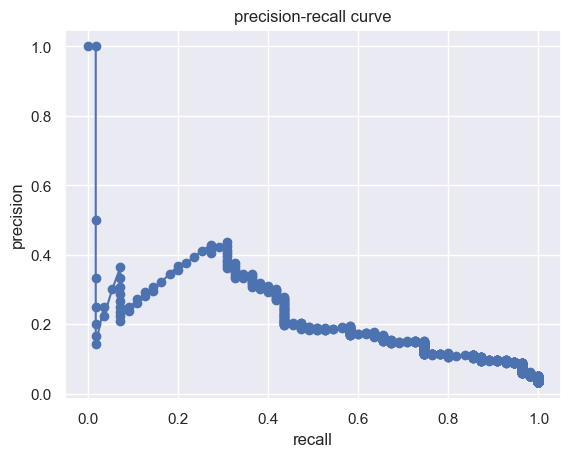

In [223]:
# xgbc

xgbc=XGBClassifier(random_state=101)
threshold_change(xgbc)

In [ ]:
# precision does not improve much after threshold tuning of the model

# Part F: upsampling (Random oversampler) --> scaling --> pca

In [ ]:
# upsampling using randomoversampler

In [192]:
from imblearn.over_sampling import RandomOverSampler

In [193]:
over_samp=RandomOverSampler(random_state=2)
x_train_over_new, y_train_over_new = over_samp.fit_resample(x_train, y_train)

In [194]:
x_train_over_new.shape, y_train_over_new.shape   # 4949 of each class

((9898, 94), (9898,))

In [ ]:
# scaling

In [ ]:
# standardizing

In [195]:
from sklearn.preprocessing import StandardScaler

In [196]:
sc=StandardScaler()
x_train_over_sc_new=sc.fit_transform(x_train_over_new)

In [197]:
x_test_sc_new=sc.transform(x_test)

In [ ]:
# pca

In [200]:
pca_new_3=PCA()
x_train_over_sc_pca_new_3=pca_new_3.fit_transform(x_train_over_sc_new)

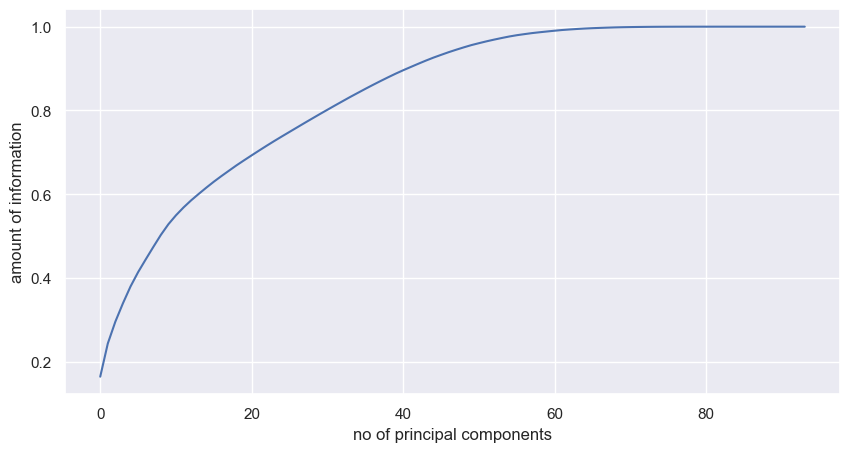

In [201]:
plt.figure(figsize=(10,5))

plt.plot(np.cumsum(pca_new_3.explained_variance_ratio_))
plt.xlabel('no of principal components')
plt.ylabel('amount of information')
plt.show()

In [ ]:
# insight: we can choose 50 components and still retain 95% info

In [202]:
pca_new_4=PCA(n_components=50)
x_train_over_sc_pca_new_4=pca_new_4.fit_transform(x_train_over_sc_new)

In [203]:
x_test_sc_pca_new_4=pca_new_4.transform(x_test_sc_new)

In [206]:
x_train_over_sc_pca_new_4.shape

(9898, 50)

In [205]:
y_train_over_new.shape

(9898,)

In [ ]:
# base algos

In [204]:
logistic=LogisticRegression(random_state = 101)
rf=RandomForestClassifier(random_state=101)
svc=SVC(random_state=101)
xgbc=XGBClassifier(random_state=101)

In [207]:
p=[]
r=[]
model_list=[]

for model in [logistic, rf, svc, xgbc]:
    print('############'*3)
    print('performance of the model', model)
    print("#############"*3)
    
    model.fit(x_train_over_sc_pca_new_4, y_train_over_new)
    y_pred_train = model.predict(x_train_over_sc_pca_new_4)
    cm_train=confusion_matrix(y_train_over_new, y_pred_train)
    cr_train=classification_report(y_train_over_new, y_pred_train)
    
    y_pred_test=model.predict(x_test_sc_pca_new_4)
    cm_test=confusion_matrix(y_test, y_pred_test)
    cr_test=classification_report(y_test, y_pred_test)
    
    print('confusion matrix-train \n', cm_train)
    print('confusion matrix-test \n', cm_test)
    
    print('classifcation report-train \n', cr_train)
    print('classifcation report-test \n', cr_test)
    
    p.append(precision_score(y_test, y_pred_test))
    r.append(recall_score(y_test, y_pred_test))
    model_list.append(model)

####################################
performance of the model LogisticRegression(random_state=101)
#######################################
confusion matrix-train 
 [[4340  609]
 [ 460 4489]]
confusion matrix-test 
 [[1433  217]
 [  15   40]]
classifcation report-train 
               precision    recall  f1-score   support

           0       0.90      0.88      0.89      4949
           1       0.88      0.91      0.89      4949

    accuracy                           0.89      9898
   macro avg       0.89      0.89      0.89      9898
weighted avg       0.89      0.89      0.89      9898

classifcation report-test 
               precision    recall  f1-score   support

           0       0.99      0.87      0.93      1650
           1       0.16      0.73      0.26        55

    accuracy                           0.86      1705
   macro avg       0.57      0.80      0.59      1705
weighted avg       0.96      0.86      0.90      1705

####################################
performanc

# Part G: scaling--> pca --> Random Oversampling

In [208]:
from imblearn.over_sampling import RandomOverSampler

In [209]:
over_samp=RandomOverSampler(random_state=2)
x_train_sc_pca2_over, y_train_over=over_samp.fit_resample(x_train_sc_pca2, y_train)

In [ ]:
# base algos

In [210]:
logistic=LogisticRegression(random_state = 101)
rf=RandomForestClassifier(random_state=101)
svc=SVC(random_state=101)
xgbc=XGBClassifier(random_state=101)

In [211]:
p=[]
r=[]
model_list=[]

for model in [logistic, rf, svc, xgbc]:
    print('############'*3)
    print('performance of the model', model)
    print("#############"*3)
    
    model.fit(x_train_sc_pca2_over, y_train_over)
    y_pred_train = model.predict(x_train_sc_pca2_over)
    cm_train=confusion_matrix(y_train_over, y_pred_train)
    cr_train=classification_report(y_train_over, y_pred_train)
    
    y_pred_test=model.predict(x_test_sc_pca2)
    cm_test=confusion_matrix(y_test, y_pred_test)
    cr_test=classification_report(y_test, y_pred_test)
    
    print('confusion matrix-train \n', cm_train)
    print('confusion matrix-test \n', cm_test)
    
    print('classifcation report-train \n', cr_train)
    print('classifcation report-test \n', cr_test)
    
    p.append(precision_score(y_test, y_pred_test))
    r.append(recall_score(y_test, y_pred_test))
    model_list.append(model)

####################################
performance of the model LogisticRegression(random_state=101)
#######################################
confusion matrix-train 
 [[4306  643]
 [ 486 4463]]
confusion matrix-test 
 [[1432  218]
 [  15   40]]
classifcation report-train 
               precision    recall  f1-score   support

           0       0.90      0.87      0.88      4949
           1       0.87      0.90      0.89      4949

    accuracy                           0.89      9898
   macro avg       0.89      0.89      0.89      9898
weighted avg       0.89      0.89      0.89      9898

classifcation report-test 
               precision    recall  f1-score   support

           0       0.99      0.87      0.92      1650
           1       0.16      0.73      0.26        55

    accuracy                           0.86      1705
   macro avg       0.57      0.80      0.59      1705
weighted avg       0.96      0.86      0.90      1705

####################################
performanc

# Part H: original data (without scaling)

In [ ]:
# base algos

In [212]:
logistic=LogisticRegression(random_state = 101)
rf=RandomForestClassifier(random_state=101)
svc=SVC(random_state=101)
xgbc=XGBClassifier(random_state=101)

In [213]:
p=[]
r=[]
model_list=[]

for model in [logistic, rf, svc, xgbc]:
    print('############'*3)
    print('performance of the model', model)
    print("#############"*3)
    
    model.fit(x_train, y_train)
    y_pred_train = model.predict(x_train)
    cm_train=confusion_matrix(y_train, y_pred_train)
    cr_train=classification_report(y_train, y_pred_train)
    
    y_pred_test=model.predict(x_test)
    cm_test=confusion_matrix(y_test, y_pred_test)
    cr_test=classification_report(y_test, y_pred_test)
    
    print('confusion matrix-train \n', cm_train)
    print('confusion matrix-test \n', cm_test)
    
    print('classifcation report-train \n', cr_train)
    print('classifcation report-test \n', cr_test)
    
    p.append(precision_score(y_test, y_pred_test))
    r.append(recall_score(y_test, y_pred_test))
    model_list.append(model)

####################################
performance of the model LogisticRegression(random_state=101)
#######################################
confusion matrix-train 
 [[4906   43]
 [ 162    3]]
confusion matrix-test 
 [[1634   16]
 [  53    2]]
classifcation report-train 
               precision    recall  f1-score   support

           0       0.97      0.99      0.98      4949
           1       0.07      0.02      0.03       165

    accuracy                           0.96      5114
   macro avg       0.52      0.50      0.50      5114
weighted avg       0.94      0.96      0.95      5114

classifcation report-test 
               precision    recall  f1-score   support

           0       0.97      0.99      0.98      1650
           1       0.11      0.04      0.05        55

    accuracy                           0.96      1705
   macro avg       0.54      0.51      0.52      1705
weighted avg       0.94      0.96      0.95      1705

####################################
performanc

# Part I: original data (without scaling) --> upsampling 

In [214]:
from imblearn.over_sampling import RandomOverSampler

In [215]:
over_samp=RandomOverSampler(random_state=2)
x_train_over, y_train_over=over_samp.fit_resample(x_train, y_train)

In [ ]:
# base algos

In [216]:
logistic=LogisticRegression(random_state = 101)
rf=RandomForestClassifier(random_state=101)
svc=SVC(random_state=101)
xgbc=XGBClassifier(random_state=101)

In [217]:
p=[]
r=[]
model_list=[]

for model in [logistic, rf, svc, xgbc]:
    print('############'*3)
    print('performance of the model', model)
    print("#############"*3)
    
    model.fit(x_train_over, y_train_over)
    y_pred_train = model.predict(x_train_over)
    cm_train=confusion_matrix(y_train_over, y_pred_train)
    cr_train=classification_report(y_train_over, y_pred_train)
    
    y_pred_test=model.predict(x_test)
    cm_test=confusion_matrix(y_test, y_pred_test)
    cr_test=classification_report(y_test, y_pred_test)
    
    print('confusion matrix-train \n', cm_train)
    print('confusion matrix-test \n', cm_test)
    
    print('classifcation report-train \n', cr_train)
    print('classifcation report-test \n', cr_test)
    
    p.append(precision_score(y_test, y_pred_test))
    r.append(recall_score(y_test, y_pred_test))
    model_list.append(model)

####################################
performance of the model LogisticRegression(random_state=101)
#######################################
confusion matrix-train 
 [[3752 1197]
 [2556 2393]]
confusion matrix-test 
 [[1254  396]
 [  33   22]]
classifcation report-train 
               precision    recall  f1-score   support

           0       0.59      0.76      0.67      4949
           1       0.67      0.48      0.56      4949

    accuracy                           0.62      9898
   macro avg       0.63      0.62      0.61      9898
weighted avg       0.63      0.62      0.61      9898

classifcation report-test 
               precision    recall  f1-score   support

           0       0.97      0.76      0.85      1650
           1       0.05      0.40      0.09        55

    accuracy                           0.75      1705
   macro avg       0.51      0.58      0.47      1705
weighted avg       0.94      0.75      0.83      1705

####################################
performanc

# Part : scaling--> Random Over sampling

In [224]:
from imblearn.over_sampling import RandomOverSampler

In [226]:
over_samp=RandomOverSampler(random_state=2)
x_train_sc_over, y_train_over=over_samp.fit_resample(x_train_sc, y_train)

In [227]:
logistic=LogisticRegression(random_state = 101)
rf=RandomForestClassifier(random_state=101)
svc=SVC(random_state=101)
xgbc=XGBClassifier(random_state=101)

In [228]:
p=[]
r=[]
model_list=[]

for model in [logistic, rf, svc, xgbc]:
    print('############'*3)
    print('performance of the model', model)
    print("#############"*3)
    
    model.fit(x_train_sc_over, y_train_over)
    y_pred_train = model.predict(x_train_sc_over)
    cm_train=confusion_matrix(y_train_over, y_pred_train)
    cr_train=classification_report(y_train_over, y_pred_train)
    
    y_pred_test=model.predict(x_test_sc)
    cm_test=confusion_matrix(y_test, y_pred_test)
    cr_test=classification_report(y_test, y_pred_test)
    
    print('confusion matrix-train \n', cm_train)
    print('confusion matrix-test \n', cm_test)
    
    print('classifcation report-train \n', cr_train)
    print('classifcation report-test \n', cr_test)
    
    p.append(precision_score(y_test, y_pred_test))
    r.append(recall_score(y_test, y_pred_test))
    model_list.append(model)

####################################
performance of the model LogisticRegression(random_state=101)
#######################################
confusion matrix-train 
 [[4419  530]
 [ 419 4530]]
confusion matrix-test 
 [[1473  177]
 [  17   38]]
classifcation report-train 
               precision    recall  f1-score   support

           0       0.91      0.89      0.90      4949
           1       0.90      0.92      0.91      4949

    accuracy                           0.90      9898
   macro avg       0.90      0.90      0.90      9898
weighted avg       0.90      0.90      0.90      9898

classifcation report-test 
               precision    recall  f1-score   support

           0       0.99      0.89      0.94      1650
           1       0.18      0.69      0.28        55

    accuracy                           0.89      1705
   macro avg       0.58      0.79      0.61      1705
weighted avg       0.96      0.89      0.92      1705

####################################
performanc

In [ ]:
# Final insights from all the models:


# 1) RF model (scaling--> pca-->undersampling) gives the highest recall 0f 0.84 and hence this model is important for us. However, the f1 is 0.24. Mean of CV Recall score is 0.86. So this model is great as far as Recall is concerned.
# 2) Voting method gives the highest precision of 0.29 with corresponding recall of 0.42 and highest f1 of 0.34 when Recall > Precision.


# Tuning the models is not helping with the precision-recall tradeoff
# also, changing the threshold is also not giving us precision>50 for high recall.

# So, the best algorithm to go with is RF that gives us a CV recall mean of 0.86.

In [ ]:
- By Jeel Raval
jlraval@gmail.com